# Preview - King's County Housing

- Goal of this notebook is to paste a template version of the workflow from the ADMIN_Comparing_Datasets notebook.
 
**The code will:**
- Create 4 preprocessing pipelines (one with scaling and one without)
    - `preprocessor`
        - Clone: `preprocessor_cln`
    - `preprocessor_scale`
        - Clone: `preprocessor_scale_cln`    
    
- Create 4 Versions of the X/y data.
    - **All Data/Rows:**
        - Starting Vars:
            - df,X,y, X_train, X_test,y_train,y_test
        - **Unscaled**
            - Without a  constant:
                - X_train_df, X_test_df, y_train,y_test
            - With a constant:
                - X_train_df_cnst, X_test_df_cnst, y_train (same), y_test (same)
        - **Scaled:**
            - Without a  constant:
                - X_train_df_scaled, X_test_df_scaled, y_train (same), y_test (same)
            - With a constant:
                - X_train_df_scaled_cnst, X_test_df_scaled_cnst, y_train (same), y_test (same)

    - **Cleaned/Outliers Removed**
        - Starting Vars:
            - df_clean,X_cln,y_cln, X_train_cln, X_test_cln,y_train_cln,y_test_cln
        - **Unscaled**
            - Without a  constant:
                - X_train_df_cln, X_test_df_cln, y_train,y_test
            - With a constant:
                - X_train_df_cln_cnst, X_test_df_cln_cnst, y_train_cln (same), y_test_cln (same)
        - **Scaled:**
            - Without a  constant:
                - X_train_df_cln_scaled, X_test_df_cln_scaled, y_train_cln (same), y_test_cln (same)
            - With a constant:
                - X_train_df_scaled_cln_cnst, X_test_df_cln_scaled_cnst, y_train_cln (same), y_test_cln (same)

# Code

In [82]:
## Adding folder above notebookt to path (for importing from CODE)
import os, sys
sys.path.append(os.path.abspath('../'))

## Automatically reload changed functions
%load_ext autoreload
%autoreload 2

# Custom Code used in lessons
import CODE
import CODE.lp_functions as lp

# Importing standard packages and viz styles
from CODE.standard_imports import *
from CODE.lp_styles import *

# Function lp.show_code to see source code
lp.show_code(CODE.standard_imports)

## Customization Options
# pd.set_option('display.float_format',lambda x: f"{x:,.4f}")
pd.set_option("display.max_columns",100)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


```python
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

```

In [83]:
lp.show_code(lp.show_code)

```python
def show_code(function):
    import inspect 
    from IPython.display import display,Markdown, display_markdown
    code = inspect.getsource(function)
    md_txt = f"```python\n{code}\n```"
    return display(Markdown(md_txt))

```

In [84]:
## additional required imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import (make_column_transformer, make_column_selector, 
                             ColumnTransformer)
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import metrics
from sklearn.base import clone

## fixing random for lesson generation
np.random.seed(321)

##import statsmodels correctly
import statsmodels.api as sm
from scipy import stats

## Customized Options
# pd.set_option('display.float_format',lambda x: f"{x:,.4f}")
# plt.style.use('seaborn-talk')

## Preliminary Checks and Dtype Conversion

- Change:
    - `FILE`: url or filepath to load
    - `DROP_COLS`: list of columns to drop from df
    - `CONVERT_TO_STR_COLS`: numeric cols to convert to str
    - `CONVERT_TO_NUM_COLS`: str cols to convert to numeric (uses pd.to_numeric)

In [85]:
## Load in data
FILE = "https://docs.google.com/spreadsheets/d/e/2PACX-1vSEZQEzxja7Hmj5tr5nc52QqBvFQdCAGb52e1FRK1PDT2_TQrS6rY_TR9tjZjKaMbCy1m5217sVmI5q/pub?output=csv"


df = pd.read_csv(FILE)
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [86]:
from pandas_profiling import ProfileReport
# ProfileReport(df)

In [87]:
# Date feature engineering 
df['datetime'] = pd.to_datetime(df['date'])

df['Month'] =  df['datetime'].dt.month_name()
df['Year'] = df['datetime'].dt.month_name()
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,datetime,Month,Year
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014-10-13,October,October
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014-12-09,December,December
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015-02-25,February,February
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014-12-09,December,December
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015-02-18,February,February
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,2014-05-21,May,May
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,2015-02-23,February,February
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,2014-06-23,June,June
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,2015-01-16,January,January


In [88]:
## Drop unwanted columns
DROP_COLS = ['id','date','datetime']
df = df.drop(columns=DROP_COLS)

In [89]:
## Convert all categories to strings
CONVERT_TO_STR_COLS = ['zipcode']
df[CONVERT_TO_STR_COLS] = df[CONVERT_TO_STR_COLS].astype(str)

CONVERT_TO_NUM_COLS = []
for col in CONVERT_TO_NUM_COLS:
    df[col] = pd.to_numeric(df[col])

In [90]:
## final info before X/y
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  float64
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   waterfront     21613 non-null  int64  
 7   view           21613 non-null  int64  
 8   condition      21613 non-null  int64  
 9   grade          21613 non-null  int64  
 10  sqft_above     21613 non-null  int64  
 11  sqft_basement  21613 non-null  int64  
 12  yr_built       21613 non-null  int64  
 13  yr_renovated   21613 non-null  int64  
 14  zipcode        21613 non-null  object 
 15  lat            21613 non-null  float64
 16  long           21613 non-null  float64
 17  sqft_living15  21613 non-null  int64  
 18  sqft_l

## Full Dataset Preprocessing

In [91]:
## Make x and y variables
target = 'price'
drop_cols_model = []

y = df[target].copy()
X = df.drop(columns=[target,*drop_cols_model]).copy()

X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=321)
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,Month,Year
8306,3,2.50,2250,9235,2.0,0,0,3,8,2250,0,1985,0,98052,47.7268,-122.105,2290,8187,October,October
18426,4,2.75,1590,6000,1.5,0,0,4,8,1590,0,1925,0,98112,47.6401,-122.299,1590,4000,March,March
11280,4,1.75,2040,6000,1.0,0,0,5,7,1020,1020,1943,0,98136,47.5507,-122.383,1440,6000,December,December
13891,3,1.00,1200,9800,1.0,0,0,4,7,1200,0,1971,0,98072,47.7412,-122.109,1220,10220,May,May
6498,3,2.25,1570,8767,1.0,0,0,3,7,1180,390,1990,0,98038,47.3568,-122.038,1570,7434,April,April


### Unscaled

In [92]:
## cat selector
cat_sel = make_column_selector(dtype_include='object')
cat_cols = cat_sel(X)

# num selectorr
num_sel = make_column_selector(dtype_include='number')
num_cols = num_sel(X)

## make pipelines & column transformer - raw numeric
cat_pipe = make_pipeline(SimpleImputer(strategy='constant',
                                       fill_value='MISSING'),
                         OneHotEncoder(handle_unknown='ignore', sparse=False))

num_pipe_raw = make_pipeline(SimpleImputer(strategy='mean'))
preprocessor = make_column_transformer((num_pipe_raw, num_sel),
                                       (cat_pipe,cat_sel), verbose_feature_names_out=False)
preprocessor

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x30f94d3d0>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x30f94d040>)],
                  verbose_feature_names_out=False)

In [93]:
### PREP ALL X VARS
## Prepare X_train_df
X_train_df = pd.DataFrame( preprocessor.fit_transform(X_train), 
                          columns=preprocessor.get_feature_names_out(),
                         index=X_train.index)

## Prepare X_test_df
X_test_df = pd.DataFrame( preprocessor.transform(X_test),
                         columns=preprocessor.get_feature_names_out(), 
                         index=X_test.index)


## Prepare X vars with constant
X_train_df_cnst = sm.add_constant(X_train_df, prepend=False, has_constant='add')
X_test_df_cnst = sm.add_constant(X_test_df, prepend=False, has_constant='add')

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


In [94]:
X_train_df.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,zipcode_98001,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,...,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Year_April,Year_August,Year_December,Year_February,Year_January,Year_July,Year_June,Year_March,Year_May,Year_November,Year_October,Year_September
count,16209.000000,16209.000000,16209.000000,1.620900e+04,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,...,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000
mean,3.370967,2.115245,2079.601703,1.520523e+04,1.497964,0.007712,0.236597,3.410328,7.661793,1791.044481,288.557221,1971.031402,85.590721,47.560254,-122.213759,1988.143932,12864.277747,0.017459,0.009501,0.012401,0.015300,0.007465,0.022518,0.006478,0.012277,0.004936,0.008822,0.006046,0.009131,0.010735,0.022518,0.003887,0.018817,0.012709,0.015362,0.012215,0.012956,0.005676,0.019989,0.024986,0.027022,0.002159,0.012956,0.025788,0.010118,0.026652,0.019249,0.012771,0.018878,0.020421,...,0.014560,0.013141,0.007835,0.005121,0.011907,0.026528,0.014683,0.025726,0.022272,0.008390,0.013881,0.019187,0.017398,0.023259,0.011784,0.016349,0.013388,0.002838,0.020729,0.011475,0.012462,0.011969,0.011722,0.006540,0.013017,0.014560,0.103214,0.091554,0.068110,0.058856,0.045345,0.101487,0.099944,0.085508,0.112345,0.065704,0.087729,0.080202,0.103214,0.091554,0.068110,0.058856,0.045345,0.101487,0.099944,0.085508,0.112345,0.065704,0.087729,0.080202
std,0.938522,0.771886,917.317141,4.212858e+04,0.541351,0.087480,0.769035,0.654447,1.178167,830.002388,440.554349,29.492575,404.410880,0.138929,0.141138,687.198385,28019.873424,0.130980,0.097011,0.110668,0.122748,0.086080,0.148367,0.080227,0.110123,0.070082,0.093515,0.077523,0.095121,0.103054,0.148367,0.062224,0.135881,0.112019,0.122991,0.109850,0.113087,0.075127,0.139966,0.156088,0.162153,0.046419,0.113087,0.158508,0.100080,0.161069,0.137402,0.112287,0.13

> The cell below should be updated for each dataset- only separating high cardinality OHE features (e.g. zipcode)

In [95]:
## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_df.columns if c.startswith('zipcode')]
nonohe_cols = X_train_df.drop(columns=[*ohe_cols]).columns.tolist()

### Scaled

In [96]:
## make pipelines & column transformer - scaled
cat_pipe = make_pipeline(SimpleImputer(strategy='constant',
                                       fill_value='MISSING'),
                         OneHotEncoder(handle_unknown='ignore', sparse=False))
num_pipe_scale = make_pipeline(SimpleImputer(strategy='mean'), StandardScaler())
preprocessor_scale = make_column_transformer((num_pipe_scale, num_sel),
                                       (cat_pipe,cat_sel), verbose_feature_names_out=False)
preprocessor_scale

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer()),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x30f94d3d0>),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='MISSING',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x30f94d040>)],
                  verbose_feature_names_out=False)

In [97]:
# ### PREP ALL SCALED X VARS


# Prepare X_train_scaled_df & X_test_scaled_df
X_train_scaled_df = pd.DataFrame( preprocessor_scale.fit_transform(X_train), 
                          columns=preprocessor_scale.get_feature_names_out(),
                         index=X_train.index)


X_test_scaled_df = pd.DataFrame( preprocessor_scale.transform(X_test),
                         columns=preprocessor_scale.get_feature_names_out(), 
                         index=X_test.index)


## Save vers with constant
X_train_scaled_df_cnst = sm.add_constant(X_train_scaled_df, prepend=False, has_constant='add')
X_test_scaled_df_cnst = sm.add_constant(X_test_scaled_df, prepend=False, has_constant='add')


## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_df.columns if c.startswith('zipcode')]
nonohe_cols = X_train_df.drop(columns=[*ohe_cols]).columns.tolist()


X_test_scaled_df.head()

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,zipcode_98001,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,...,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Year_April,Year_August,Year_December,Year_February,Year_January,Year_July,Year_June,Year_March,Year_May,Year_November,Year_October,Year_September
16660,-1.460818,-0.473199,-0.032271,-0.078458,-0.919883,-0.088157,-0.307664,0.901051,0.287071,0.312003,-0.655007,-0.713130,-0.211650,0.436539,-0.037138,1.443377,-0.034415,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2905,-0.395279,-0.797092,-0.424732,-0.130491,0.003761,-0.088157,-0.307664,2.429105,-0.561731,-0.121744,-0.655007,-0.577499,-0.211650,0.093189,0.550956,-0.608495,-0.107294,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7700,-0.395279,0.822369,1.515769,-0.132817,2.774691,11.343368,4.893821,-0.627003,2.833479,2.022895,-0.655007,0.609277,4.733968,1.153473,-0.327642,3.116891,-0.035307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16733,0.670259,0.498477,0.491010,-0.167023,0.927404,-0.088157,-0.307664,-0.627003,0.287071,0.890333,-0.655007,0.744909,-0.211650,-2.136792,-0.696087,0.337404,-0.173142,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
15334,-0.395279,1.146261,1.799213,8.738346,0.003761,-0.088157,-0.307664,0.901051,1.135874,0.528877,2.749899,0.643185,-0.211650,-0.968535,1.302016,-0.070060,7.314167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [98]:
X_train_scaled_df.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,zipcode_98001,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,...,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Year_April,Year_August,Year_December,Year_February,Year_January,Year_July,Year_June,Year_March,Year_May,Year_November,Year_October,Year_September
count,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,1.620900e+04,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,...,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000
mean,1.946332e-16,-2.716755e-16,-7.276827e-17,-2.191815e-17,-7.890536e-18,1.315089e-17,-6.049411e-17,-1.773179e-16,2.695933e-16,-4.471304e-17,-8.548080e-17,-2.006388e-15,9.994678e-17,-5.685438e-14,5.796124e-14,-1.258102e-16,2.674015e-17,0.017459,0.009501,0.012401,0.015300,0.007465,0.022518,0.006478,0.012277,0.004936,0.008822,0.006046,0.009131,0.010735,0.022518,0.003887,0.018817,0.012709,0.015362,0.012215,0.012956,0.005676,0.019989,0.024986,0.027022,0.002159,0.012956,0.025788,0.010118,0.026652,0.019249,0.012771,0.018878,0.020421,...,0.014560,0.013141,0.007835,0.005121,0.011907,0.026528,0.014683,0.025726,0.022272,0.008390,0.013881,0.019187,0.017398,0.023259,0.011784,0.016349,0.013388,0.002838,0.020729,0.011475,0.012462,0.011969,0.011722,0.006540,0.013017,0.014560,0.103214,0.091554,0.068110,0.058856,0.045345,0.101487,0.099944,0.085508,0.112345,0.065704,0.087729,0.080202,0.103214,0.091554,0.068110,0.058856,0.045345,0.101487,0.099944,0.085508,0.112345,0.065704,0.087729,0.080202
std,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,1.000031e+00,0.130980,0.097011,0.110668,0.122748,0.086080,0.148367,0.080227,0.110123,0.070082,0.093515,0.077523,0.095121,0.103054,0.148367,0.062224,0.135881,0.112019,0.122991,0.109850,0.113087,0.

## Cleaned Dataset Preprocessing

### Remove Outliers

In [99]:
lp.show_code(lp.remove_outliers)

```python
def remove_outliers(df_,method='iqr', subset=None, verbose=2):
    """Returns a copy of the input df with outleirs removed from all
    columns using the selected method (either 'iqr' or 'z'/'zscore')
    
    Arguments:
        df_ (Frame): Dataframe to copy and remove outleirs from
        method (str): Method of outlier removal. Options are 'iqr' or 'z' (default is 'iqr')
        subset (list or None): List of column names to remove outliers from. If None, uses all numeric columns.
        verbose (bool, int): If verbose==1, print only overall summary. If verbose==2, print detailed summary"""
    import pandas as pd
    ## Make a cope of input dataframe  
    df = df_.copy()
    
    ## Set verbose_func for calls to outleir funcs
    if verbose==2:
        verbose_func = True
    else:
        verbose_func=False
        
    ## Set outlier removal function and name
    if method.lower()=='iqr':
        find_outlier_func = find_outliers_IQR
        method_name = "IQR rule"
    elif 'z' in method.lower():
        find_outlier_func = find_outliers_Z
        method_name = 'Z_score rule'
    else:
        raise Exception('[!] Method must be either "iqr" or "z".')
        
    ## Set list of cols to remove outliers from
    if subset is None:
        col_list = df.select_dtypes('number').columns
    elif isinstance(subset,str):
        col_list = [subset]
    elif isinstance(subset, list):
        col_list = subset
    else:
        raise Exception("[!] subset must be None, a single string, or a list of strings.")

    

    
    ## Empty dict for both types of outliers
    outliers = {}

    ## Use both functions to see the comparison for # of outliers
    for col in col_list:
        idx_outliers = find_outlier_func(df[col],verbose=verbose_func)
        outliers[col] = idx_outliers

    
    ## Getting final df of all outliers to get 1 final T/F index
    outliers_combined = pd.DataFrame(outliers).any(axis=1)
    
    if verbose:
        n = len(outliers_combined)
        print(f"\n[i] Overall, {outliers_combined.sum():,} rows out of {n:,}({outliers_combined.sum()/n*100:.2f}%) were removed as outliers using {method_name}.")
    
    
    # remove_outliers 
    df_clean = df[~outliers_combined].copy()
    return df_clean

```

In [100]:
df_clean_iqr = lp.remove_outliers(df,verbose=2)
df_clean_iqr

- 1,159 outliers found in price out of 21,613 rows (5.36%) using IQR.
- 546 outliers found in bedrooms out of 21,613 rows (2.53%) using IQR.
- 571 outliers found in bathrooms out of 21,613 rows (2.64%) using IQR.
- 572 outliers found in sqft_living out of 21,613 rows (2.65%) using IQR.
- 2,425 outliers found in sqft_lot out of 21,613 rows (11.22%) using IQR.
- 0 outliers found in floors out of 21,613 rows (0.00%) using IQR.
- 163 outliers found in waterfront out of 21,613 rows (0.75%) using IQR.
- 2,124 outliers found in view out of 21,613 rows (9.83%) using IQR.
- 30 outliers found in condition out of 21,613 rows (0.14%) using IQR.
- 1,911 outliers found in grade out of 21,613 rows (8.84%) using IQR.
- 611 outliers found in sqft_above out of 21,613 rows (2.83%) using IQR.
- 496 outliers found in sqft_basement out of 21,613 rows (2.29%) using IQR.
- 0 outliers found in yr_built out of 21,613 rows (0.00%) using IQR.
- 914 outliers found in yr_renovated out of 21,613 rows (4.23%) using I

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,Month,Year
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,October,October
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,February,February
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,December,December
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,February,February
6,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819,June,June
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,May,May
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,February,February
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,June,June
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,January,January


In [21]:
df_clean_z = lp.remove_outliers(df,method='z')
df_clean_z

- 406 outliers found in price out of 21,613 rows (1.88%) using Z-scores.
- 75 outliers found in bedrooms out of 21,613 rows (0.35%) using Z-scores.
- 187 outliers found in bathrooms out of 21,613 rows (0.87%) using Z-scores.
- 248 outliers found in sqft_living out of 21,613 rows (1.15%) using Z-scores.
- 347 outliers found in sqft_lot out of 21,613 rows (1.61%) using Z-scores.
- 8 outliers found in floors out of 21,613 rows (0.04%) using Z-scores.
- 163 outliers found in waterfront out of 21,613 rows (0.75%) using Z-scores.
- 829 outliers found in view out of 21,613 rows (3.84%) using Z-scores.
- 30 outliers found in condition out of 21,613 rows (0.14%) using Z-scores.
- 136 outliers found in grade out of 21,613 rows (0.63%) using Z-scores.
- 254 outliers found in sqft_above out of 21,613 rows (1.18%) using Z-scores.
- 247 outliers found in sqft_basement out of 21,613 rows (1.14%) using Z-scores.
- 0 outliers found in yr_built out of 21,613 rows (0.00%) using Z-scores.
- 914 outliers f

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
2,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
6,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [22]:
## Make x and y variables
# target = 'price'
# drop_cols_model = []

y_cln = df_clean_z[target].copy()
X_cln = df_clean_z.drop(columns=[target,*drop_cols_model]).copy()

X_train_cln, X_test_cln, y_train_cln, y_test_cln = train_test_split(X_cln,y_cln, random_state=321)
X_train_cln.head()

,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6406,20150226T000000,3,1.75,1750,9623,1.0,0,0,3,7,1150,600,1962,0,98198,47.3997,-122.313,1820,9623
16601,20140630T000000,3,2.50,3180,7904,1.0,0,0,3,8,1810,1370,2006,0,98056,47.4890,-122.181,1950,7800
16481,20140617T000000,3,1.50,880,6600,1.0,0,0,5,6,880,0,1945,0,98178,47.5002,-122.247,1020,6600
13797,20141029T000000,4,2.25,2620,33578,2.0,0,0,3,7,2620,0,1977,0,98075,47.5921,-122.013,2520,35160
9833,20140507T000000,2,1.00,820,2723,1.0,0,0,3,7,820,0,1921,0,98103,47.6623,-122.339,1370,3850


### Unscaled

In [23]:
## Cloning the Previous 2 Preprocessors
preprocessor_cln = clone(preprocessor)
preprocessor_cln_scale = clone(preprocessor_scale)

In [24]:
### PREP ALL X VARS
## Prepare X_train_df
X_train_df_cln = pd.DataFrame( preprocessor_cln.fit_transform(X_train_cln), 
                          columns=preprocessor_cln.get_feature_names_out(),
                         index=X_train_cln.index)

## Prepare X_test_df
X_test_df_cln = pd.DataFrame( preprocessor_cln.transform(X_test_cln),
                         columns=preprocessor_cln.get_feature_names_out(), 
                         index=X_test_cln.index)


## Prepare X vars with constant
X_train_df_cln_cnst = sm.add_constant(X_train_df_cln, prepend=False, has_constant='add')
X_test_df_cln_cnst = sm.add_constant(X_test_df_cln, prepend=False, has_constant='add')


## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_df_cln.columns if c.startswith('zipcode')]
nonohe_cols = X_train_df_cln.drop(columns=[*ohe_cols]).columns.tolist()

X_test_df.head()

/opt/homebrew/Caskroom/miniforge/base/envs/dojo-env/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:808: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
16660,2.0,1.75,2050.0,11900.0,1.0,0.0,0.0,4.0,8.0,2050.0,0.0,1950.0,0.0,47.6209,-122.219,2980.0,11900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2905,3.0,1.50,1690.0,9708.0,1.5,0.0,0.0,5.0,7.0,1690.0,0.0,1954.0,0.0,47.5732,-122.136,1570.0,9858.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7700,3.0,2.75,3470.0,9610.0,3.0,1.0,4.0,3.0,11.0,3470.0,0.0,1989.0,2000.0,47.7205,-122.260,4130.0,11875.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16733,4.0,2.50,2530.0,8169.0,2.0,0.0,0.0,3.0,8.0,2530.0,0.0,1993.0,0.0,47.2634,-122.312,2220.0,8013.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15334,3.0,3.00,3730.0,383328.0,1.5,0.0,0.0,4.0,9.0,2230.0,1500.0,1990.0,0.0,47.4257,-122.030,1940.0,217800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
X_train_df_cln.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
count,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,...,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000
mean,3.322829,2.038001,1951.864894,9817.669614,1.481998,0.0,0.089405,3.422715,7.535078,1697.819549,254.045344,1971.727292,0.0,47.560516,-122.220398,1913.074433,9029.714245,0.003066,0.000143,0.000214,0.003993,0.004278,0.003921,0.004064,0.003779,0.000214,0.000143,0.003494,0.003779,0.003707,0.003707,0.002781,0.000071,0.000285,0.004420,0.004777,0.004064,0.003351,0.003565,0.000499,0.000285,0.000570,0.004919,0.005419,0.003208,0.002638,0.000214,0.000356,0.004420,0.004848,...,0.006417,0.019393,0.026094,0.027378,0.000713,0.010053,0.027592,0.000499,0.028875,0.017753,0.013332,0.020818,0.021817,0.023029,0.014402,0.002567,0.012905,0.020676,0.017254,0.008270,0.016541,0.004706,0.029018,0.009981,0.016826,0.013546,0.008983,0.005205,0.010409,0.029873,0.013760,0.027093,0.024668,0.007985,0.012619,0.019606,0.016256,0.025025,0.011835,0.014544,0.012976,0.002709,0.022244,0.010980,0.014259,0.010908,0.011122,0.006631,0.012905,0.013974
std,0.848706,0.691919,740.005605,11416.579410,0.538447,0.0,0.395508,0.648856,1.028411,711.184980,387.164969,28.993672,0.0,0.140097,0.128678,600.621487,8785.328471,0.055286,0.011941,0.014624,0.063063,0.065267,0.062500,0.

### Scaled

In [26]:
# ### PREP ALL SCALED X VARS


# Prepare X_train_scaled_df & X_test_scaled_df
X_train_scaled_df_cln = pd.DataFrame( preprocessor_cln_scale.fit_transform(X_train_cln), 
                          columns=preprocessor_cln_scale.get_feature_names_out(),
                         index=X_train_cln.index)


X_test_scaled_df_cln = pd.DataFrame( preprocessor_cln_scale.transform(X_test_cln),
                         columns=preprocessor_cln_scale.get_feature_names_out(), 
                         index=X_test_cln.index)


## Save vers with constant
X_train_scaled_df_cln_cnst = sm.add_constant(X_train_scaled_df_cln, prepend=False, has_constant='add')
X_test_scaled_df_cln_cnst = sm.add_constant(X_test_scaled_df_cln, prepend=False, has_constant='add')


## Save list of zipcode columns and other columns
ohe_cols = [c for c in X_train_scaled_df_cln.columns if c.startswith('zipcode')]
nonohe_cols = X_train_scaled_df_cln.drop(columns=[*ohe_cols]).columns.tolist()


X_train_scaled_df_cln.head()

/opt/homebrew/Caskroom/miniforge/base/envs/dojo-env/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:808: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
6406,-0.380392,-0.416250,-0.272798,-0.017052,-0.895194,0.0,-0.22606,-0.651501,-0.520314,-0.770319,0.893591,-0.335509,0.0,-1.147934,-0.719669,-0.154969,0.067534,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
16601,-0.380392,0.667731,1.659689,-0.167628,-0.895194,0.0,-0.22606,-0.651501,0.452095,0.157743,2.882478,1.182118,0.0,-0.510494,0.306185,0.061481,-0.139979,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16481,-0.380392,-0.777577,-1.448507,-0.281852,-0.895194,0.0,-0.22606,2.430957,-1.492723,-1.149980,-0.656192,-0.921865,0.0,-0.430546,-0.206742,-1.486970,-0.276575,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
13797,0.797915,0.306404,0.902911,2.081287,0.962064,0.0,-0.22606,-0.651501,-0.520314,1.296728,-0.656192,0.181864,0.0,0.225453,1.611817,1.010532,2.974416,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9833,-1.558698,-1.500230,-1.529590,-0.621458,-0.895194,0.0,-0.22606,-0.651501,-0.520314,-1.234350,-0.656192,-1.749661,0.0,0.726554,-0.921731,-0.904220,-0.589608,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [27]:
X_train_scaled_df_cln.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
count,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,...,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000
mean,2.269522e-16,1.904777e-16,-1.043575e-16,-2.064353e-17,-7.193574e-17,0.0,2.127677e-17,-6.028418e-17,9.574546e-17,1.104366e-16,8.004118e-17,-3.185436e-15,0.0,2.031273e-14,-2.339431e-14,2.836902e-17,2.380972e-17,0.003066,0.000143,0.000214,0.003993,0.004278,0.003921,0.004064,0.003779,0.000214,0.000143,0.003494,0.003779,0.003707,0.003707,0.002781,0.000071,0.000285,0.004420,0.004777,0.004064,0.003351,0.003565,0.000499,0.000285,0.000570,0.004919,0.005419,0.003208,0.002638,0.000214,0.000356,0.004420,0.004848,...,0.006417,0.019393,0.026094,0.027378,0.000713,0.010053,0.027592,0.000499,0.028875,0.017753,0.013332,0.020818,0.021817,0.023029,0.014402,0.002567,0.012905,0.020676,0.017254,0.008270,0.016541,0.004706,0.029018,0.009981,0.016826,0.013546,0.008983,0.005205,0.010409,0.029873,0.013760,0.027093,0.024668,0.007985,0.012619,0.019606,0.016256,0.025025,0.011835,0.014544,0.012976,0.002709,0.022244,0.010980,0.014259,0.010908,0.011122,0.006631,0.012905,0.013974
std,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e

## Modeling - Full Dataset

### Raw Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     154.9
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:15   Log-Likelihood:            -2.1700e+05
No. Observations:               16209   AIC:                         4.349e+05
Df Residuals:                   15755   BIC:                         4.384e+05
Df Model:                         453                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -2.415e+04   1760.249    -13.720      0.000   -2.76e+04   -2.07e+04
bathrooms             2.489e+04   3035.821      8.200      0.000    1.89e+04    3.08e+04
sqft_living            109.5753      2.173     50.419      0.000     105.315     113.835
sqft_lot                 0.2161      0.044      4.904      0.000       0.130       0.303
floors                -4.68e+04   3680.845    -12.713      0.000    -5.4e+04   -3.96e+04
waterfront            6.629e+05   1.63e+04     40.754      0.000    6.31e+05    6.95e+05
view                  5.899e+04   2039.256     28.926      0.000     5.5e+04     6.3e+04
condition             2.572e+04   2241.447     11.474      0.000    2.13e+04    3.01e+04
grade                 5.949e+04   2111.177     28.177      0.000    5.53e+04    6.36e+04
sqft_above              91.4770      2.213     41.342      0.000      87.140      95.814
sqft_basement           15.3490      2.553      6.012      0.000      10.345      20.353
yr_built              -624.1493     75.619     -8.254      0.000    -772.372    -475.927
yr_renovated            17.1393      3.409      5.028      0.000      10.457      23.821
lat                    1.56e+05   7.35e+04      2.121      0.034    1.18e+04       3e+05
long                 -1.388e+05   5.21e+04     -2.662      0.008   -2.41e+05   -3.66e+04
sqft_living15           11.3560      3.373      3.366      0.001       4.744      17.968
sqft_lot15              -0.0884      0.068     -1.291      0.197      -0.222       0.046
date_20140502T000000 -3.768e+06   1.13e+06     -3.340      0.001   -5.98e+06   -1.56e+06
date_20140503T000000 -3.661e+06   1.13e+06     -3.242      0.001   -5.87e+06   -1.45e+06
date_20140504T000000 -3.821e+06   1.13e+06     -3.376      0.001   -6.04e+06    -1.6e+06
date_20140505T000000 -3.782e+06   1.13e+06     -3.353      0.001   -5.99e+06   -1.57e+06
date_20140506T000000 -3.767e+06   1.13e+06     -3.339      0.001   -5.98e+06   -1.56e+06
date_20140507T000000 -3.756e+06   1.13e+06     -3.329      0.001   -5.97e+06   -1.54e+06
date_20140508T000000 -3.737e+06   1.13e+06     -3.314      0.001   -5.95e+06   -1.53e+06
date_20140509T000000 -3.765e+06   1.13e+06     -3.337      0.001   -5.98e+06   -1.55e+06
date_20140510T000000 -3.725e+06   1.13e+06     -3.294      0.001   -5.94e+06   -1.51e+06
date_20140511T000000 -3.716e+06   1.13e+06     -3.277      0.001   -5.94e+06   -1.49e+06
date_20140512T000000 -3.797e+06   1.13e+06     -3.366      0.001   -6.01e+06   -1.59e+06
date_20140513T000000 -3.731e+06   1.13e+06     -3.307      0.001   -5.94e+06   -1.52e+06
date_20140514T000000 -3.762e+06   1.13e+06     -3.335      0.001   -5.97e+06   -1.55e+06
date_20140515T000000 -3.773e+06   1.13e+06     -3.344      0.001   -5.98e+06   -1.56e+06
date_20140516T000000 -3.771e+06   1.13e+06     -3.343    

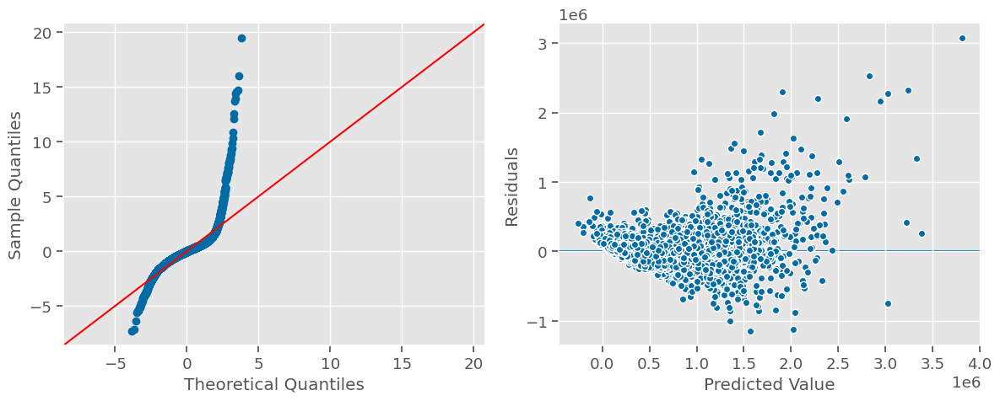

In [28]:
## instantiate an OLS model WITH the training data.
model_raw = sm.OLS(y_train, X_train_df)

## Fit the model and view the summary
result_raw = model_raw.fit()
lp.evaluate_ols(result_raw,X_train_df, y_train)

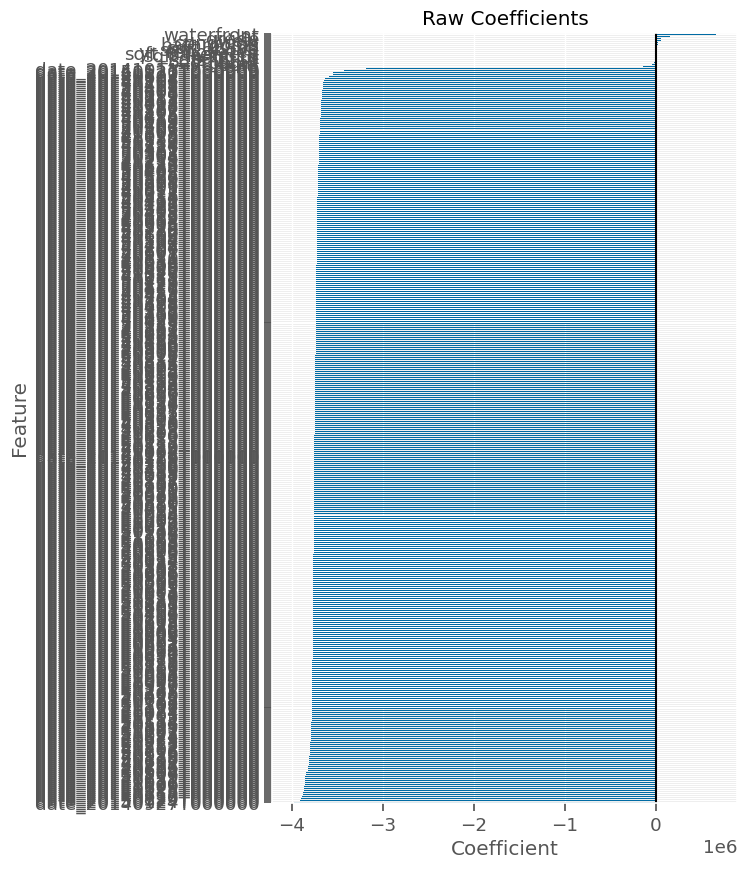

In [29]:
fig_raw = lp.plot_coeffs(result_raw, ohe_cols, include_const=True,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_SIDE_PROJECTS/_BEN/summit-2023-ds-team-session-stack-5-overview/CODE/lp_functions.py:761: UserWarning: [!] These features were not found in the params: ['date_20140803T000000', 'date_20150308T000000']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


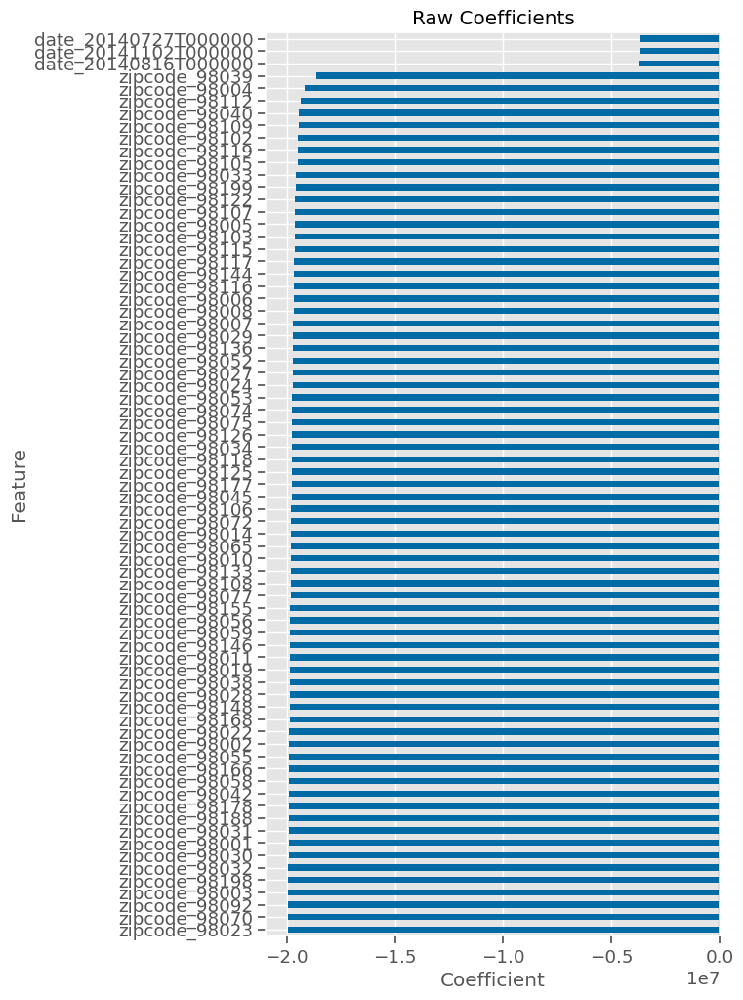

In [30]:
fig_raw_zips =lp.plot_coeffs(result_raw, nonohe_cols, figsize=(6,12),
                           include_const=True,title="Raw Coefficients")

### Raw Numeric - with Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     154.9
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:19   Log-Likelihood:            -2.1700e+05
No. Observations:               16209   AIC:                         4.349e+05
Df Residuals:                   15755   BIC:                         4.384e+05
Df Model:                         453                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -2.415e+04   1760.249    -13.720      0.000   -2.76e+04   -2.07e+04
bathrooms             2.489e+04   3035.821      8.200      0.000    1.89e+04    3.08e+04
sqft_living            108.6590      2.150     50.535      0.000     104.444     112.874
sqft_lot                 0.2161      0.044      4.904      0.000       0.130       0.303
floors                -4.68e+04   3680.845    -12.713      0.000    -5.4e+04   -3.96e+04
waterfront            6.629e+05   1.63e+04     40.754      0.000    6.31e+05    6.95e+05
view                  5.899e+04   2039.256     28.926      0.000     5.5e+04     6.3e+04
condition             2.572e+04   2241.447     11.474      0.000    2.13e+04    3.01e+04
grade                 5.949e+04   2111.177     28.177      0.000    5.53e+04    6.36e+04
sqft_above              92.3933      2.207     41.857      0.000      88.067      96.720
sqft_basement           16.2654      2.532      6.423      0.000      11.302      21.229
yr_built              -624.1493     75.619     -8.254      0.000    -772.372    -475.927
yr_renovated            17.1393      3.409      5.028      0.000      10.457      23.821
lat                    1.56e+05   7.35e+04      2.121      0.034    1.18e+04       3e+05
long                 -1.388e+05   5.21e+04     -2.662      0.008   -2.41e+05   -3.66e+04
sqft_living15           11.3560      3.373      3.366      0.001       4.744      17.968
sqft_lot15              -0.0884      0.068     -1.291      0.197      -0.222       0.046
date_20140502T000000 -8.624e+04   2.92e+04     -2.952      0.003   -1.43e+05    -2.9e+04
date_20140503T000000   2.02e+04   8.19e+04      0.247      0.805    -1.4e+05    1.81e+05
date_20140504T000000 -1.399e+05   9.44e+04     -1.483      0.138   -3.25e+05    4.51e+04
date_20140505T000000 -1.011e+05   2.77e+04     -3.652      0.000   -1.55e+05   -4.68e+04
date_20140506T000000 -8.573e+04    2.8e+04     -3.057      0.002   -1.41e+05   -3.08e+04
date_20140507T000000 -7.471e+04   2.73e+04     -2.734      0.006   -1.28e+05   -2.11e+04
date_20140508T000000  -5.58e+04   2.88e+04     -1.941      0.052   -1.12e+05     562.237
date_20140509T000000 -8.359e+04   2.76e+04     -3.027      0.002   -1.38e+05   -2.95e+04
date_20140510T000000 -4.317e+04   7.41e+04     -0.582      0.560   -1.88e+05    1.02e+05
date_20140511T000000 -3.433e+04   1.15e+05     -0.299      0.765   -2.59e+05    1.91e+05
date_20140512T000000 -1.161e+05   2.81e+04     -4.128      0.000   -1.71e+05    -6.1e+04
date_20140513T000000 -4.995e+04   2.73e+04     -1.828      0.068   -1.04e+05    3622.686
date_20140514T000000 -8.106e+04   2.82e+04     -2.874      0.004   -1.36e+05   -2.58e+04
date_20140515T000000 -9.143e+04   2.84e+04     -3.217      0.001   -1.47e+05   -3.57e+04
date_20140516T000000 -8.982e+04   2.87e+04     -3.133    

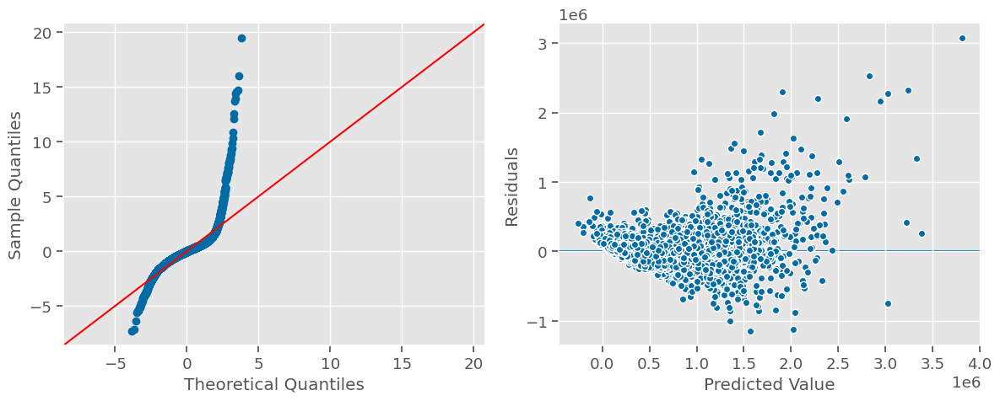

In [31]:
## instantiate an OLS model WITH the training data.
model_raw_cnst = sm.OLS(y_train, X_train_df_cnst)

## Fit the model and view the summary
result_raw_cnst = model_raw_cnst.fit()
lp.evaluate_ols(result_raw_cnst,X_train_df_cnst, y_train)

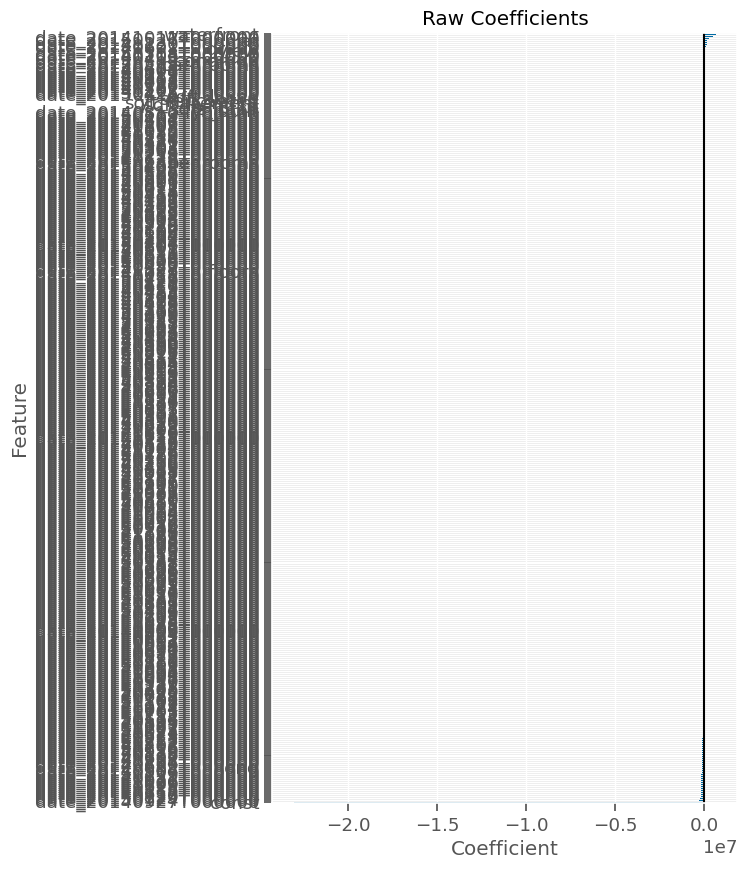

In [32]:
fig_raw =lp.plot_coeffs(result_raw_cnst, ohe_cols, include_const=True,title="Raw Coefficients")

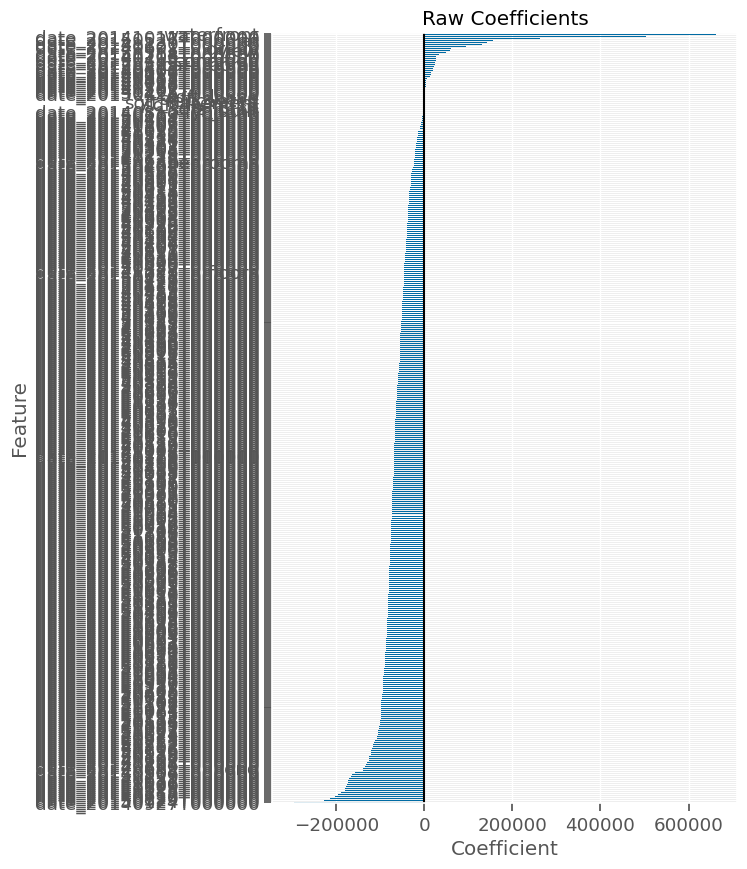

In [33]:
fig_raw =lp.plot_coeffs(result_raw_cnst, ohe_cols, include_const=False,title="Raw Coefficients")

/Users/codingdojo/Documents/GitHub/_SIDE_PROJECTS/_BEN/summit-2023-ds-team-session-stack-5-overview/CODE/lp_functions.py:761: UserWarning: [!] These features were not found in the params: ['date_20140803T000000', 'date_20150308T000000']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


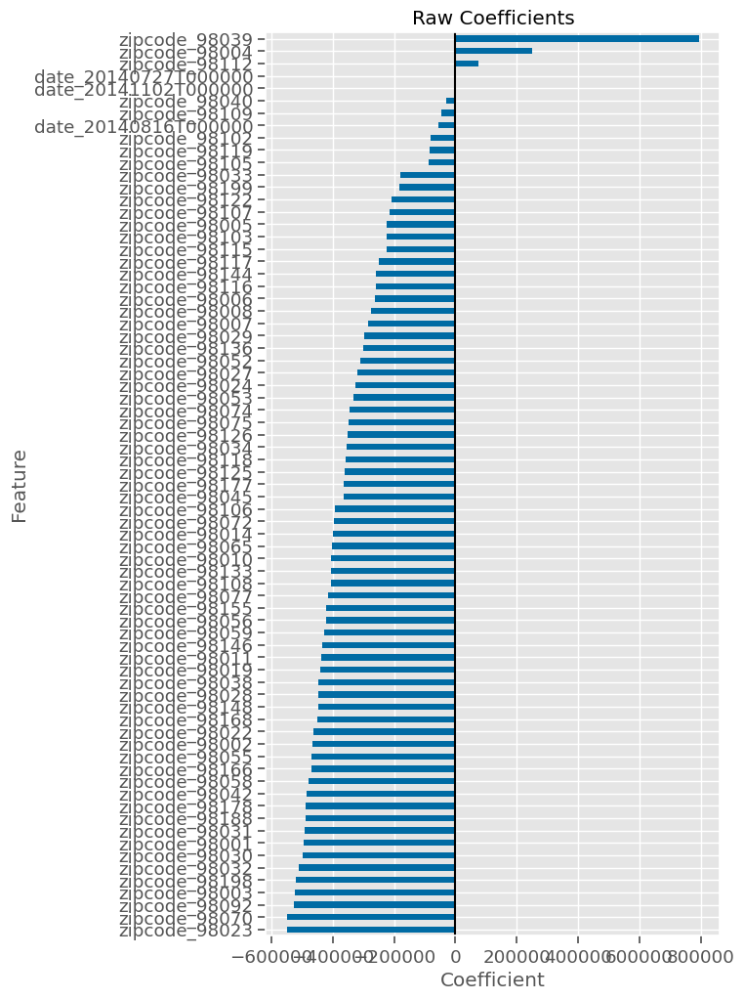

In [34]:
fig_raw_zips =lp.plot_coeffs(result_raw_cnst, nonohe_cols, figsize=(6,12),include_const=False,title="Raw Coefficients")

### Scaled Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     154.9
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:26   Log-Likelihood:            -2.1700e+05
No. Observations:               16209   AIC:                         4.349e+05
Df Residuals:                   15755   BIC:                         4.384e+05
Df Model:                         453                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -2.266e+04   1651.981    -13.720      0.000   -2.59e+04   -1.94e+04
bathrooms             1.921e+04   2343.234      8.200      0.000    1.46e+04    2.38e+04
sqft_living           8.657e+04   1523.123     56.839      0.000    8.36e+04    8.96e+04
sqft_lot              9104.4731   1856.687      4.904      0.000    5465.153    1.27e+04
floors               -2.533e+04   1992.568    -12.713      0.000   -2.92e+04   -2.14e+04
waterfront            5.799e+04   1422.899     40.754      0.000    5.52e+04    6.08e+04
view                  4.536e+04   1568.211     28.926      0.000    4.23e+04    4.84e+04
condition             1.683e+04   1466.864     11.474      0.000     1.4e+04    1.97e+04
grade                 7.008e+04   2487.242     28.177      0.000    6.52e+04     7.5e+04
sqft_above            8.854e+04   1650.394     53.646      0.000    8.53e+04    9.18e+04
sqft_basement         1.346e+04   1484.789      9.063      0.000    1.05e+04    1.64e+04
yr_built             -1.841e+04   2230.140     -8.254      0.000   -2.28e+04    -1.4e+04
yr_renovated          6931.0957   1378.618      5.028      0.000    4228.847    9633.344
lat                   2.167e+04   1.02e+04      2.121      0.034    1645.083    4.17e+04
long                 -1.959e+04   7358.480     -2.662      0.008    -3.4e+04   -5168.137
sqft_living15         7803.5559   2318.048      3.366      0.001    3259.915    1.23e+04
sqft_lot15           -2475.6645   1917.020     -1.291      0.197   -6233.243    1281.914
date_20140502T000000  6.539e+04   2.24e+04      2.924      0.003    2.16e+04    1.09e+05
date_20140503T000000  1.718e+05      8e+04      2.147      0.032    1.49e+04    3.29e+05
date_20140504T000000  1.171e+04   9.24e+04      0.127      0.899   -1.69e+05    1.93e+05
date_20140505T000000  5.056e+04   2.02e+04      2.504      0.012     1.1e+04    9.01e+04
date_20140506T000000  6.591e+04   2.07e+04      3.187      0.001    2.54e+04    1.06e+05
date_20140507T000000  7.692e+04   1.96e+04      3.924      0.000    3.85e+04    1.15e+05
date_20140508T000000  9.583e+04   2.22e+04      4.323      0.000    5.24e+04    1.39e+05
date_20140509T000000  6.804e+04      2e+04      3.397      0.001    2.88e+04    1.07e+05
date_20140510T000000  1.085e+05   7.16e+04      1.515      0.130   -3.19e+04    2.49e+05
date_20140511T000000  1.173e+05   1.13e+05      1.036      0.300   -1.05e+05    3.39e+05
date_20140512T000000  3.551e+04   2.08e+04      1.704      0.088   -5329.761    7.64e+04
date_20140513T000000  1.017e+05   1.96e+04      5.189      0.000    6.33e+04     1.4e+05
date_20140514T000000  7.057e+04    2.1e+04      3.360      0.001    2.94e+04    1.12e+05
date_20140515T000000   6.02e+04   2.12e+04      2.842      0.004    1.87e+04    1.02e+05
date_20140516T000000  6.182e+04   2.15e+04      2.870    

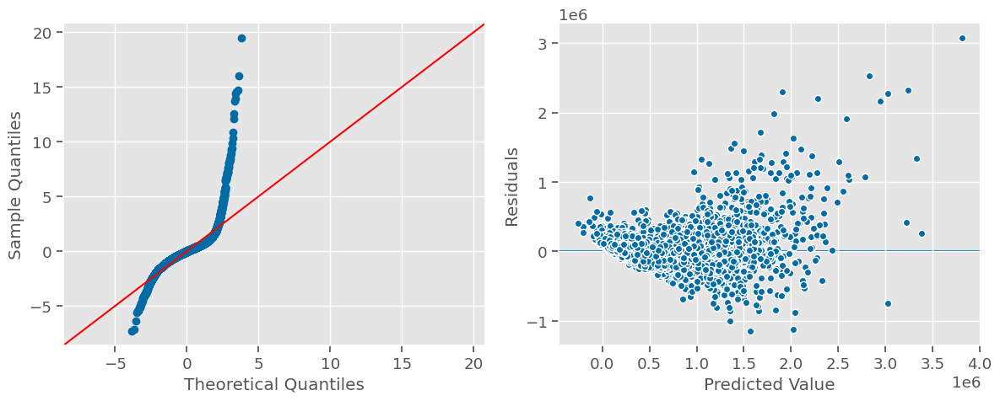

In [35]:
## instantiate an OLS model WITH the training data.
model_scaled = sm.OLS(y_train, X_train_scaled_df)

## Fit the model and view the summary
result_scaled = model_scaled.fit()
lp.evaluate_ols(result_scaled,X_train_scaled_df, y_train)

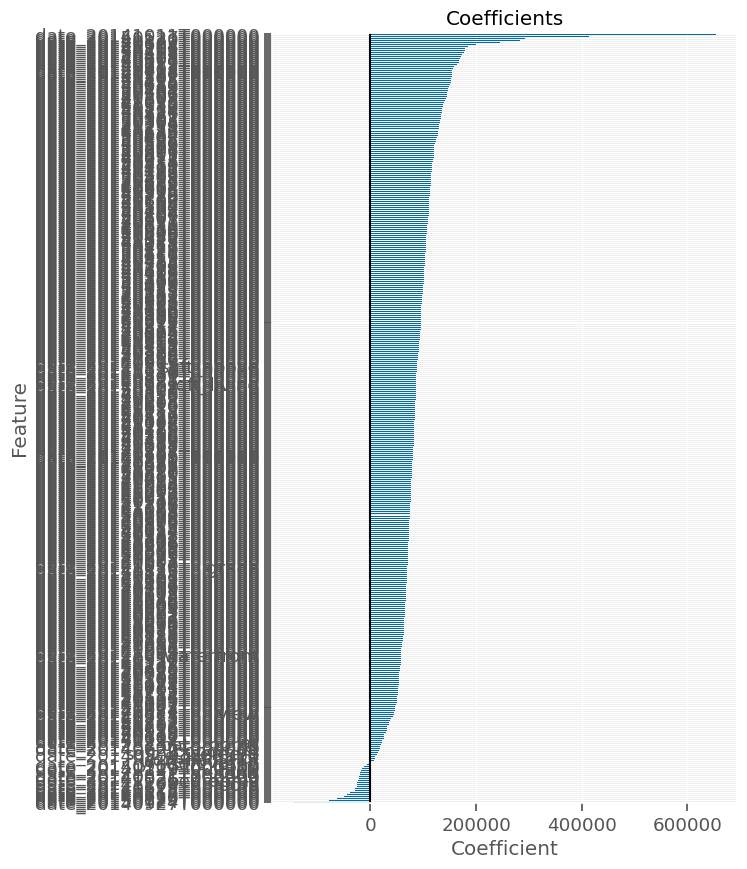

In [36]:
fig_scaled =lp.plot_coeffs(result_scaled,ohe_cols,include_const=True)

/Users/codingdojo/Documents/GitHub/_SIDE_PROJECTS/_BEN/summit-2023-ds-team-session-stack-5-overview/CODE/lp_functions.py:761: UserWarning: [!] These features were not found in the params: ['date_20140803T000000', 'date_20150308T000000']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


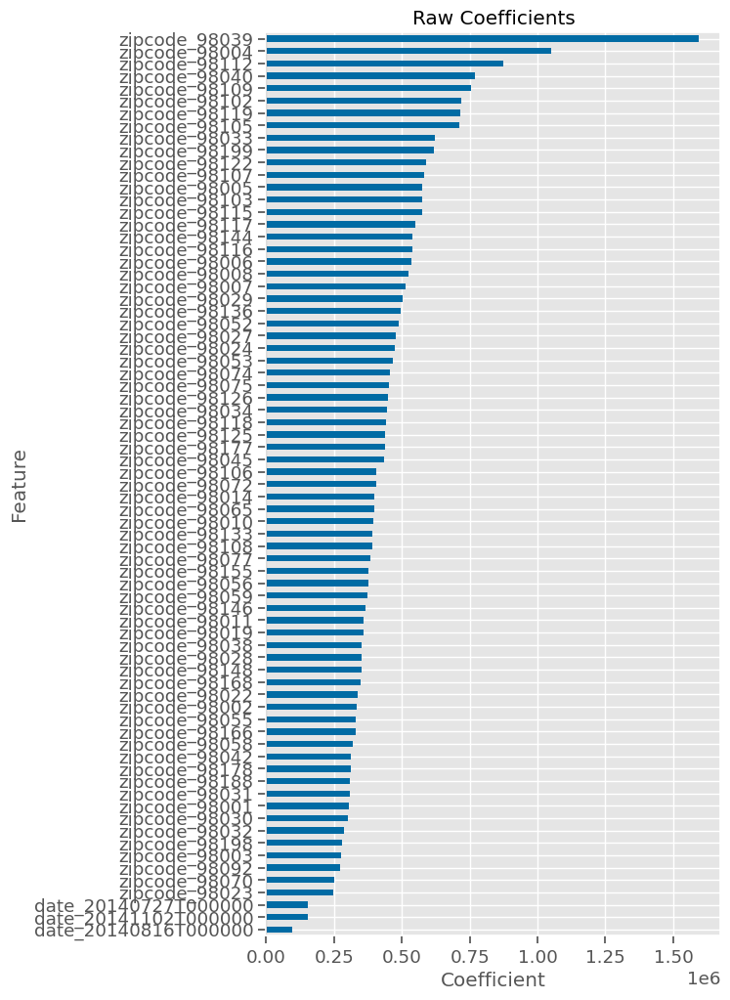

In [37]:
fig_scaled_zips =lp.plot_coeffs(result_scaled, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

### Scaled Numeric - with Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.817
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     154.9
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:30   Log-Likelihood:            -2.1700e+05
No. Observations:               16209   AIC:                         4.349e+05
Df Residuals:                   15755   BIC:                         4.384e+05
Df Model:                         453                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -2.266e+04   1651.981    -13.720      0.000   -2.59e+04   -1.94e+04
bathrooms             1.921e+04   2343.234      8.200      0.000    1.46e+04    2.38e+04
sqft_living           8.657e+04   1523.123     56.839      0.000    8.36e+04    8.96e+04
sqft_lot              9104.4731   1856.687      4.904      0.000    5465.153    1.27e+04
floors               -2.533e+04   1992.568    -12.713      0.000   -2.92e+04   -2.14e+04
waterfront            5.799e+04   1422.899     40.754      0.000    5.52e+04    6.08e+04
view                  4.536e+04   1568.211     28.926      0.000    4.23e+04    4.84e+04
condition             1.683e+04   1466.864     11.474      0.000     1.4e+04    1.97e+04
grade                 7.008e+04   2487.242     28.177      0.000    6.52e+04     7.5e+04
sqft_above            8.854e+04   1650.394     53.646      0.000    8.53e+04    9.18e+04
sqft_basement         1.346e+04   1484.789      9.063      0.000    1.05e+04    1.64e+04
yr_built             -1.841e+04   2230.140     -8.254      0.000   -2.28e+04    -1.4e+04
yr_renovated          6931.0957   1378.618      5.028      0.000    4228.847    9633.344
lat                   2.167e+04   1.02e+04      2.121      0.034    1645.083    4.17e+04
long                 -1.959e+04   7358.480     -2.662      0.008    -3.4e+04   -5168.137
sqft_living15         7803.5559   2318.048      3.366      0.001    3259.915    1.23e+04
sqft_lot15           -2475.6645   1917.020     -1.291      0.197   -6233.243    1281.914
date_20140502T000000 -2.219e+04   2.24e+04     -0.990      0.322   -6.61e+04    2.17e+04
date_20140503T000000  8.425e+04      8e+04      1.053      0.292   -7.26e+04    2.41e+05
date_20140504T000000 -7.586e+04   9.24e+04     -0.821      0.412   -2.57e+05    1.05e+05
date_20140505T000000 -3.701e+04   2.03e+04     -1.827      0.068   -7.67e+04    2686.839
date_20140506T000000 -2.167e+04   2.07e+04     -1.045      0.296   -6.23e+04     1.9e+04
date_20140507T000000 -1.065e+04   1.97e+04     -0.542      0.588   -4.92e+04    2.79e+04
date_20140508T000000  8251.7410   2.22e+04      0.371      0.710   -3.53e+04    5.18e+04
date_20140509T000000 -1.953e+04   2.01e+04     -0.972      0.331   -5.89e+04    1.99e+04
date_20140510T000000  2.089e+04   7.16e+04      0.292      0.771   -1.19e+05    1.61e+05
date_20140511T000000  2.973e+04   1.13e+05      0.263      0.793   -1.92e+05    2.52e+05
date_20140512T000000 -5.206e+04   2.09e+04     -2.492      0.013    -9.3e+04   -1.11e+04
date_20140513T000000   1.41e+04   1.97e+04      0.717      0.473   -2.44e+04    5.26e+04
date_20140514T000000 -1.701e+04   2.11e+04     -0.808      0.419   -5.83e+04    2.43e+04
date_20140515T000000 -2.737e+04   2.12e+04     -1.289      0.198    -6.9e+04    1.43e+04
date_20140516T000000 -2.576e+04   2.16e+04     -1.193    

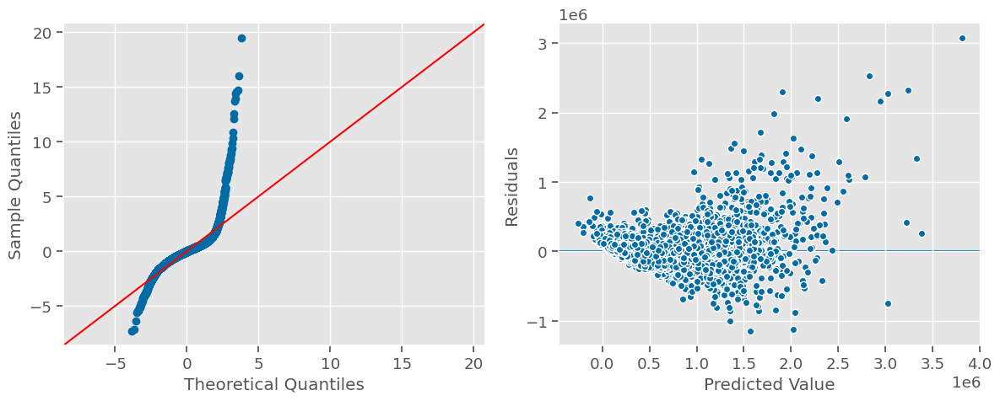

In [38]:
## instantiate an OLS model WITH the training data.
model_scaled_cnst = sm.OLS(y_train, X_train_scaled_df_cnst)

## Fit the model and view the summary
result_scaled_cnst = model_scaled_cnst.fit()
lp.evaluate_ols(result_scaled_cnst,X_train_scaled_df_cnst, y_train)

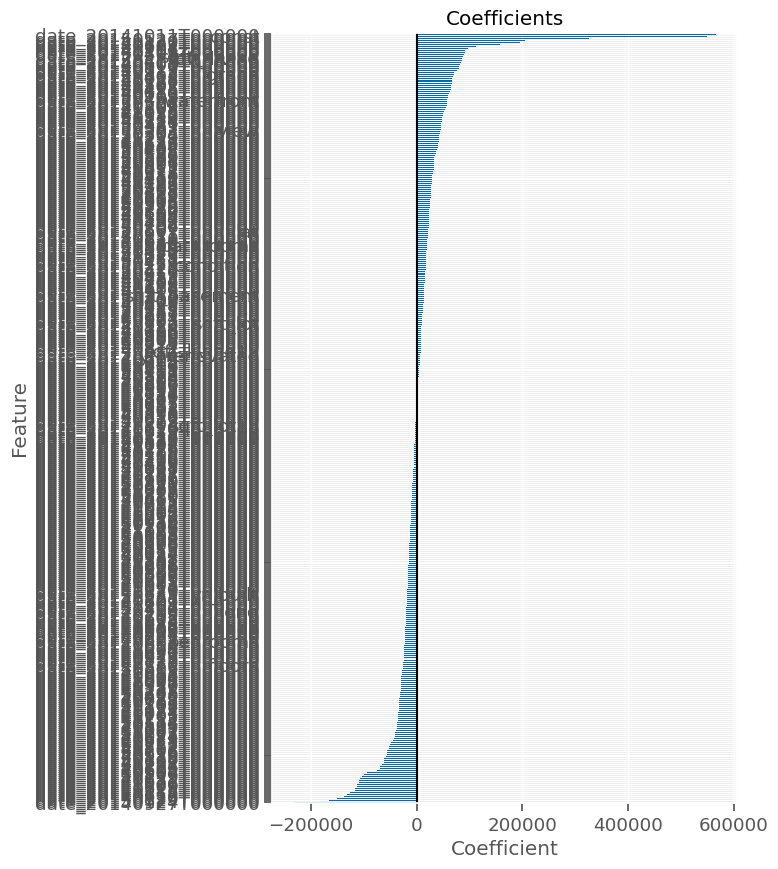

In [39]:
fig_scaled =lp.plot_coeffs(result_scaled_cnst,ohe_cols,include_const=True)

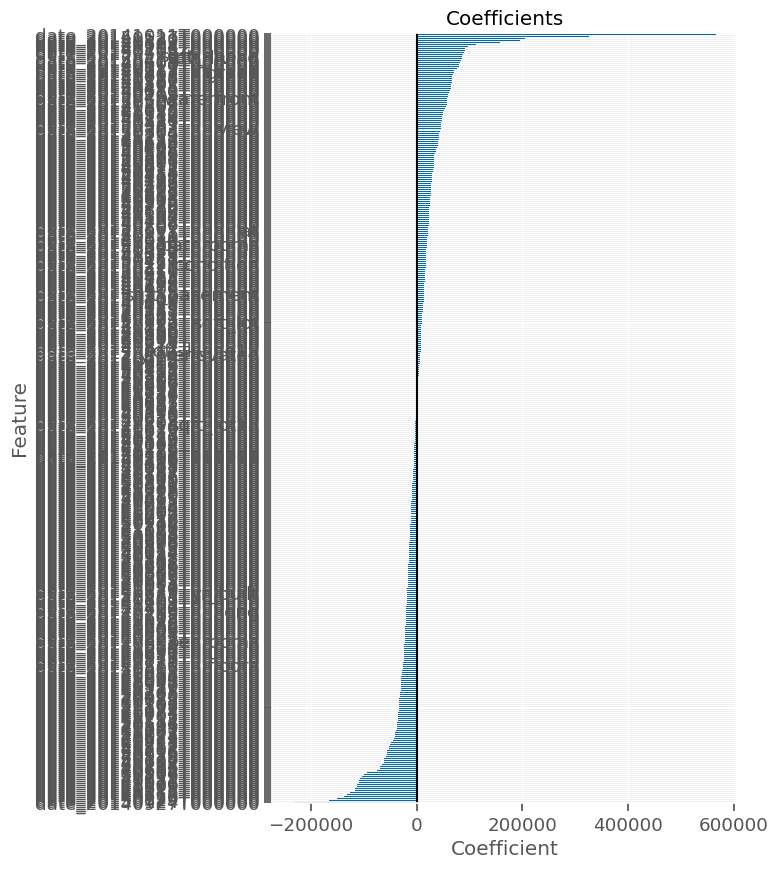

In [40]:
fig_scaled =lp.plot_coeffs(result_scaled_cnst,ohe_cols,include_const=False)

/Users/codingdojo/Documents/GitHub/_SIDE_PROJECTS/_BEN/summit-2023-ds-team-session-stack-5-overview/CODE/lp_functions.py:761: UserWarning: [!] These features were not found in the params: ['date_20140803T000000', 'date_20150308T000000']
  warnings.warn(f"[!] These features were not found in the params: {dne_cols}")


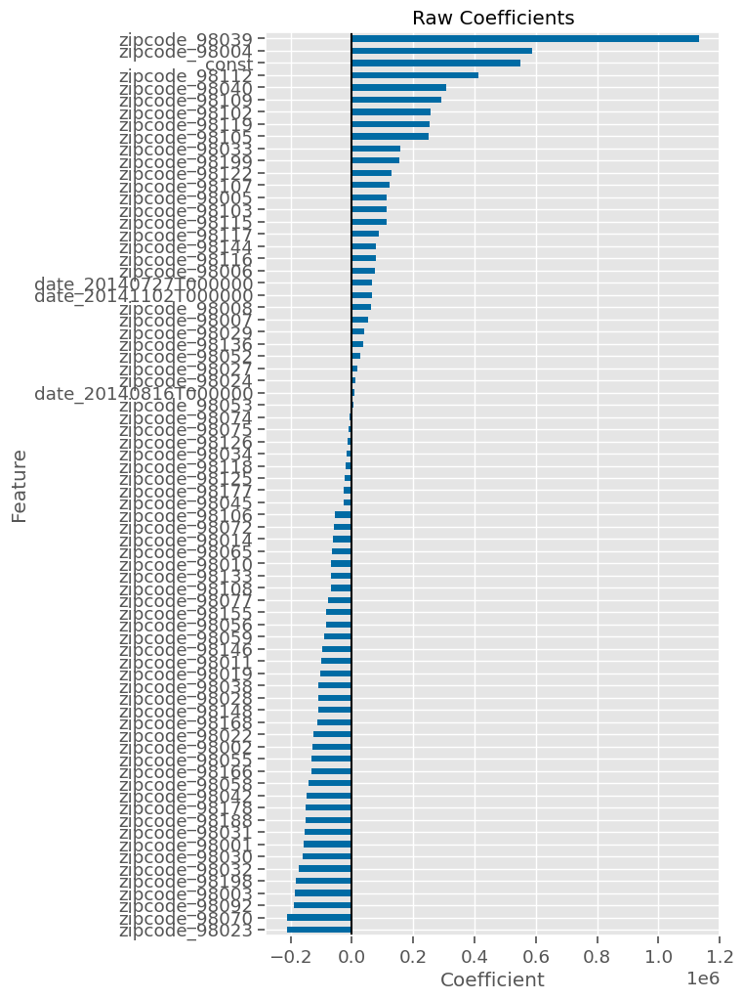

In [41]:
fig_scaled_zips =lp.plot_coeffs(result_scaled_cnst, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

## Modeling - No Outliers

### Raw Numeric - No Constant

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     158.6
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:38   Log-Likelihood:            -1.8033e+05
No. Observations:               14026   AIC:                         3.616e+05
Df Residuals:                   13575   BIC:                         3.650e+05
Df Model:                         450                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -4991.4303   1267.848     -3.937      0.000   -7476.588   -2506.273
bathrooms             1.658e+04   2091.544      7.927      0.000    1.25e+04    2.07e+04
sqft_living             72.3277      1.602     45.157      0.000      69.188      75.467
sqft_lot                 1.1062      0.122      9.054      0.000       0.867       1.346
floors               -2.471e+04   2428.440    -10.176      0.000   -2.95e+04      -2e+04
waterfront               0.0070      0.002      3.191      0.001       0.003       0.011
view                  3.605e+04   2149.880     16.767      0.000    3.18e+04    4.03e+04
condition             2.606e+04   1448.784     17.990      0.000    2.32e+04    2.89e+04
grade                  4.92e+04   1427.031     34.477      0.000    4.64e+04     5.2e+04
sqft_above              65.6021      1.576     41.633      0.000      62.514      68.691
sqft_basement            4.8112      1.820      2.643      0.008       1.243       8.379
yr_built              -484.6582     49.974     -9.698      0.000    -582.613    -386.703
yr_renovated             0.2640      0.083      3.191      0.001       0.102       0.426
lat                   1.156e+05   4.95e+04      2.334      0.020    1.85e+04    2.13e+05
long                 -1.149e+05   4.69e+04     -2.450      0.014   -2.07e+05    -2.3e+04
sqft_living15           23.8688      2.416      9.880      0.000      19.133      28.604
sqft_lot15              -0.7392      0.168     -4.410      0.000      -1.068      -0.411
date_20140502T000000 -3.047e+06   9.43e+05     -3.230      0.001    -4.9e+06    -1.2e+06
date_20140503T000000 -2.928e+06   9.46e+05     -3.096      0.002   -4.78e+06   -1.07e+06
date_20140504T000000 -3.051e+06   9.44e+05     -3.231      0.001    -4.9e+06    -1.2e+06
date_20140505T000000 -3.017e+06   9.43e+05     -3.199      0.001   -4.87e+06   -1.17e+06
date_20140506T000000 -3.041e+06   9.43e+05     -3.224      0.001   -4.89e+06   -1.19e+06
date_20140507T000000 -3.024e+06   9.43e+05     -3.206      0.001   -4.87e+06   -1.18e+06
date_20140508T000000 -3.017e+06   9.43e+05     -3.199      0.001   -4.87e+06   -1.17e+06
date_20140509T000000 -3.055e+06   9.43e+05     -3.240      0.001    -4.9e+06   -1.21e+06
date_20140510T000000 -3.003e+06   9.45e+05     -3.178      0.001   -4.86e+06   -1.15e+06
date_20140511T000000 -2.993e+06   9.46e+05     -3.166      0.002   -4.85e+06   -1.14e+06
date_20140512T000000 -3.012e+06   9.43e+05     -3.194      0.001   -4.86e+06   -1.16e+06
date_20140513T000000 -3.017e+06   9.43e+05     -3.198      0.001   -4.87e+06   -1.17e+06
date_20140514T000000 -3.021e+06   9.43e+05     -3.204      0.001   -4.87e+06   -1.17e+06
date_20140515T000000 -3.026e+06   9.43e+05     -3.209      0.001   -4.87e+06   -1.18e+06
date_20140516T000000 -3.025e+06   9.43e+05     -3.208    

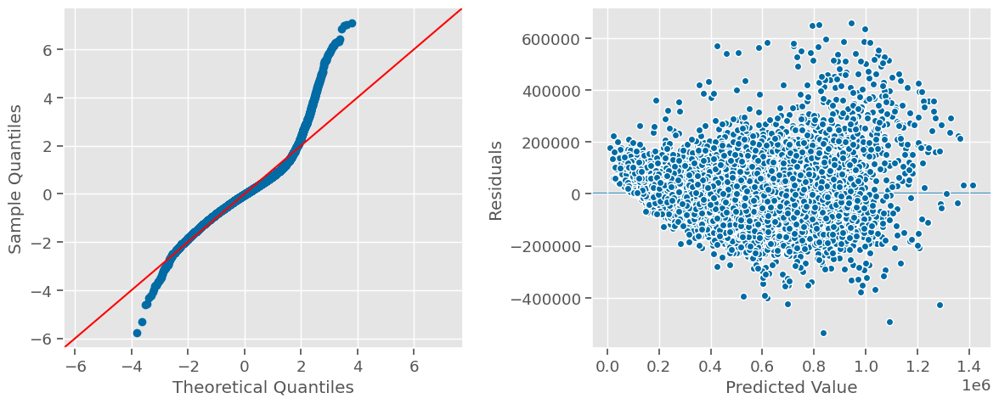

In [42]:
## instantiate an OLS model WITH the training data.
model_cln = sm.OLS(y_train_cln, X_train_df_cln)

## Fit the model and view the summary
result_cln = model_cln.fit()
lp.evaluate_ols(result_cln,X_train_df_cln, y_train_cln)

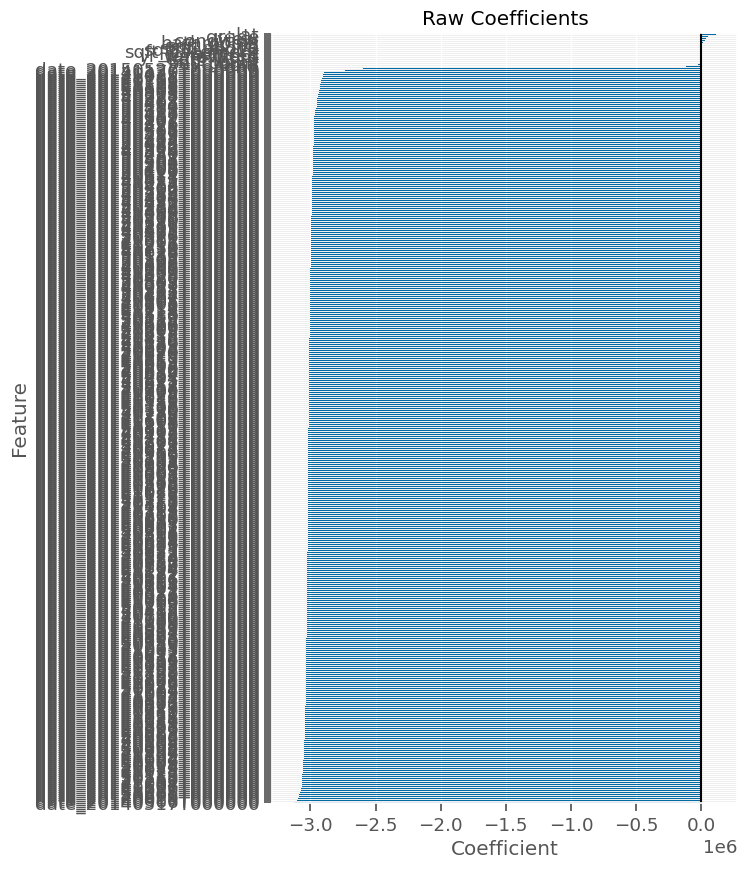

In [43]:
fig_raw =lp.plot_coeffs(result_cln, ohe_cols, include_const=True,title="Raw Coefficients")

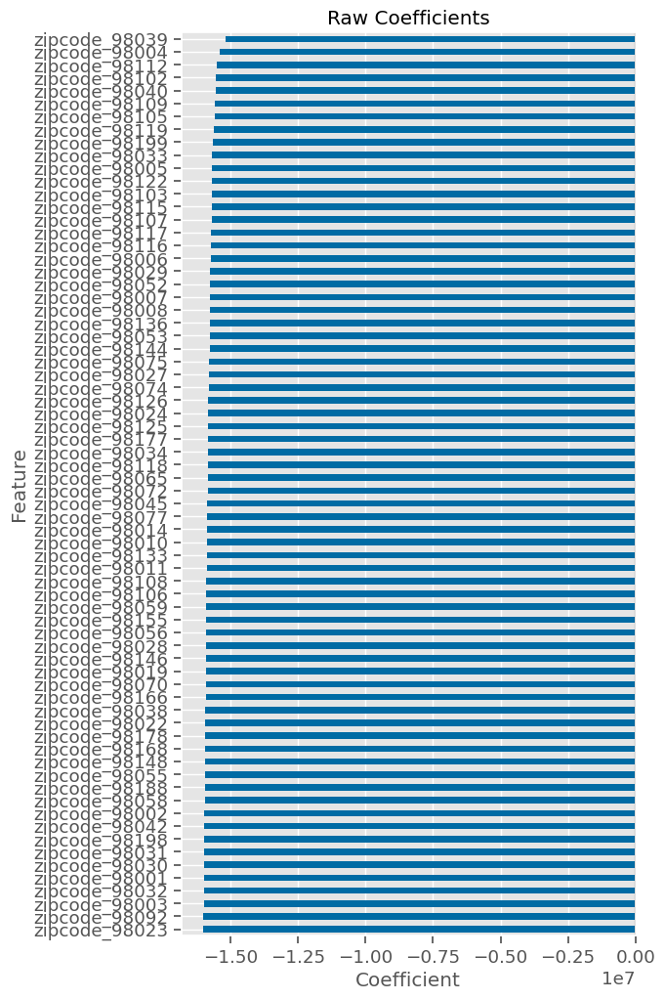

In [44]:
fig_raw_zips =lp.plot_coeffs(result_cln, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

### Raw Numeric - with Constant

In [45]:
X_train_df_cln_cnst.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,const
count,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,...,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0
mean,3.322829,2.038001,1951.864894,9817.669614,1.481998,0.0,0.089405,3.422715,7.535078,1697.819549,254.045344,1971.727292,0.0,47.560516,-122.220398,1913.074433,9029.714245,0.003066,0.000143,0.000214,0.003993,0.004278,0.003921,0.004064,0.003779,0.000214,0.000143,0.003494,0.003779,0.003707,0.003707,0.002781,0.000071,0.000285,0.004420,0.004777,0.004064,0.003351,0.003565,0.000499,0.000285,0.000570,0.004919,0.005419,0.003208,0.002638,0.000214,0.000356,0.004420,0.004848,...,0.019393,0.026094,0.027378,0.000713,0.010053,0.027592,0.000499,0.028875,0.017753,0.013332,0.020818,0.021817,0.023029,0.014402,0.002567,0.012905,0.020676,0.017254,0.008270,0.016541,0.004706,0.029018,0.009981,0.016826,0.013546,0.008983,0.005205,0.010409,0.029873,0.013760,0.027093,0.024668,0.007985,0.012619,0.019606,0.016256,0.025025,0.011835,0.014544,0.012976,0.002709,0.022244,0.010980,0.014259,0.010908,0.011122,0.006631,0.012905,0.013974,1.0
std,0.848706,0.691919,740.005605,11416.579410,0.538447,0.0,0.395508,0.648856,1.028411,711.184980,387.164969,28.993672,0.0,0.140097,0.128678,600.621487,8785.328471,0.055286,0.011941,0.014624,0.063063,0.065267,0.062500,0.063621,0.061357,0.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     158.6
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:42   Log-Likelihood:            -1.8033e+05
No. Observations:               14026   AIC:                         3.616e+05
Df Residuals:                   13575   BIC:                         3.650e+05
Df Model:                         450                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -4991.4303   1267.848     -3.937      0.000   -7476.588   -2506.273
bathrooms             1.658e+04   2091.544      7.927      0.000    1.25e+04    2.07e+04
sqft_living             71.6771      1.588     45.145      0.000      68.565      74.789
sqft_lot                 1.1062      0.122      9.054      0.000       0.867       1.346
floors               -2.471e+04   2428.440    -10.176      0.000   -2.95e+04      -2e+04
waterfront               0.0052      0.002      3.192      0.001       0.002       0.008
view                  3.605e+04   2149.880     16.767      0.000    3.18e+04    4.03e+04
condition             2.606e+04   1448.784     17.990      0.000    2.32e+04    2.89e+04
grade                  4.92e+04   1427.031     34.477      0.000    4.64e+04     5.2e+04
sqft_above              66.2527      1.573     42.108      0.000      63.169      69.337
sqft_basement            5.4617      1.802      3.032      0.002       1.930       8.993
yr_built              -484.6582     49.974     -9.698      0.000    -582.613    -386.703
yr_renovated            -0.0037      0.001     -3.192      0.001      -0.006      -0.001
lat                   1.156e+05   4.95e+04      2.334      0.020    1.85e+04    2.13e+05
long                 -1.149e+05   4.69e+04     -2.450      0.014   -2.07e+05    -2.3e+04
sqft_living15           23.8688      2.416      9.880      0.000      19.133      28.604
sqft_lot15              -0.7392      0.168     -4.410      0.000      -1.068      -0.411
date_20140502T000000 -8.762e+04   2.14e+04     -4.085      0.000    -1.3e+05   -4.56e+04
date_20140503T000000  3.121e+04   6.85e+04      0.455      0.649   -1.03e+05    1.66e+05
date_20140504T000000 -9.167e+04   5.67e+04     -1.616      0.106   -2.03e+05    1.95e+04
date_20140505T000000  -5.83e+04   2.03e+04     -2.879      0.004    -9.8e+04   -1.86e+04
date_20140506T000000 -8.156e+04      2e+04     -4.084      0.000   -1.21e+05   -4.24e+04
date_20140507T000000 -6.495e+04   2.04e+04     -3.182      0.001   -1.05e+05   -2.49e+04
date_20140508T000000 -5.751e+04   2.02e+04     -2.853      0.004    -9.7e+04    -1.8e+04
date_20140509T000000 -9.644e+04   2.05e+04     -4.705      0.000   -1.37e+05   -5.63e+04
date_20140510T000000  -4.43e+04   5.68e+04     -0.780      0.435   -1.56e+05     6.7e+04
date_20140511T000000 -3.447e+04   6.86e+04     -0.503      0.615   -1.69e+05       1e+05
date_20140512T000000 -5.315e+04   2.08e+04     -2.553      0.011    -9.4e+04   -1.23e+04
date_20140513T000000 -5.794e+04   2.06e+04     -2.810      0.005   -9.84e+04   -1.75e+04
date_20140514T000000 -6.241e+04   2.05e+04     -3.050      0.002   -1.03e+05   -2.23e+04
date_20140515T000000 -6.695e+04   2.05e+04     -3.273      0.001   -1.07e+05   -2.69e+04
date_20140516T000000 -6.615e+04   2.19e+04     -3.025    

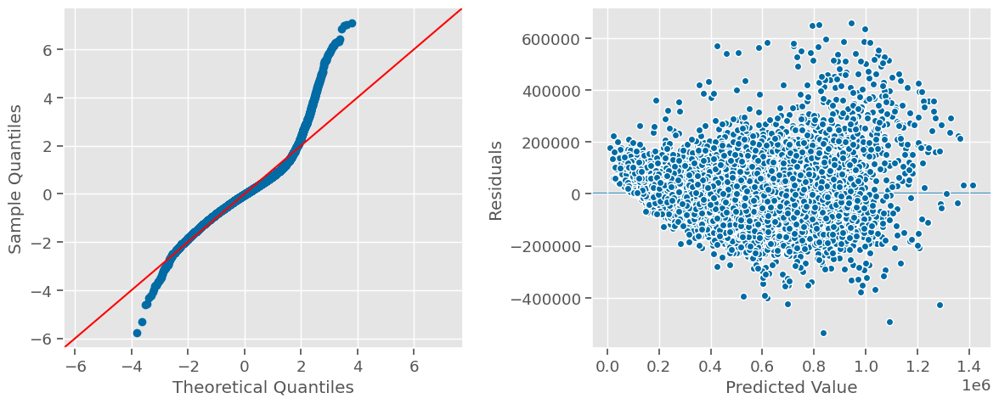

In [46]:
## instantiate an OLS model WITH the training data.
model_cln_cnst = sm.OLS(y_train_cln, X_train_df_cln_cnst)

## Fit the model and view the summary
result_cln_cnst = model_cln_cnst.fit()
lp.evaluate_ols(result_cln_cnst,X_train_df_cln_cnst, y_train_cln)

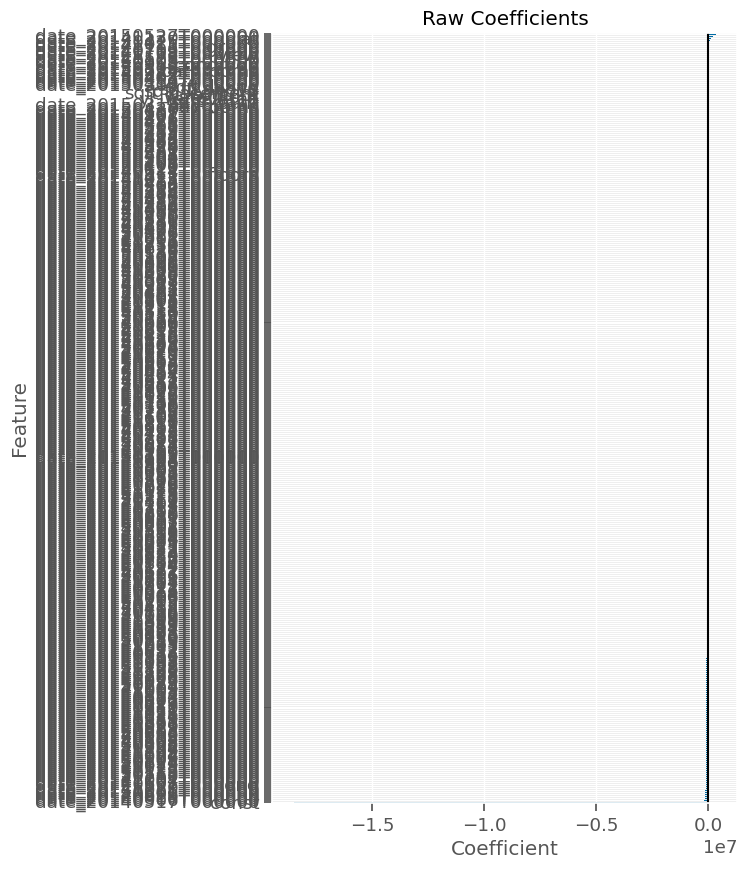

In [47]:
fig_raw =lp.plot_coeffs(result_cln_cnst, ohe_cols, include_const=True,title="Raw Coefficients")

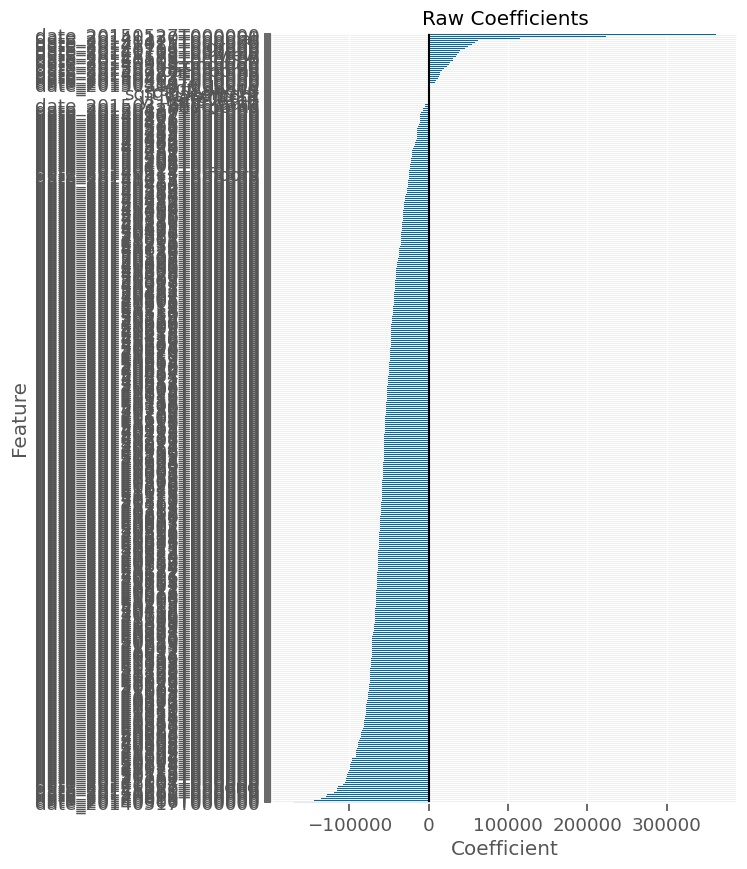

In [48]:
fig_raw =lp.plot_coeffs(result_cln_cnst, ohe_cols, include_const=False,title="Raw Coefficients")

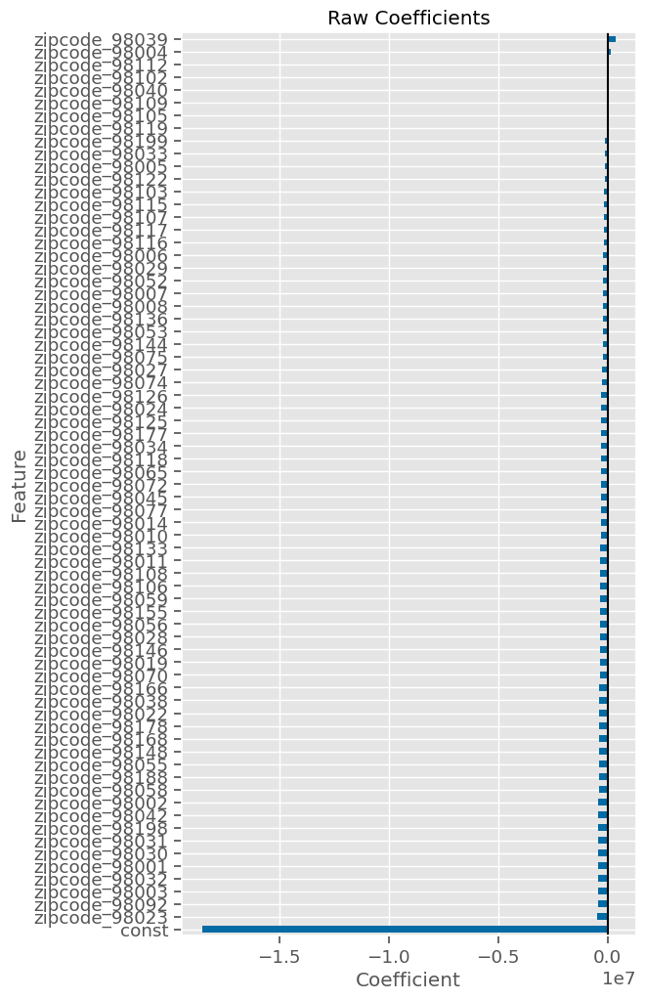

In [49]:
fig_raw_zips =lp.plot_coeffs(result_cln_cnst, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

### Scaled Numeric - No Constant

In [50]:
X_train_scaled_df_cln.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
count,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,...,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000
mean,2.269522e-16,1.904777e-16,-1.043575e-16,-2.064353e-17,-7.193574e-17,0.0,2.127677e-17,-6.028418e-17,9.574546e-17,1.104366e-16,8.004118e-17,-3.185436e-15,0.0,2.031273e-14,-2.339431e-14,2.836902e-17,2.380972e-17,0.003066,0.000143,0.000214,0.003993,0.004278,0.003921,0.004064,0.003779,0.000214,0.000143,0.003494,0.003779,0.003707,0.003707,0.002781,0.000071,0.000285,0.004420,0.004777,0.004064,0.003351,0.003565,0.000499,0.000285,0.000570,0.004919,0.005419,0.003208,0.002638,0.000214,0.000356,0.004420,0.004848,...,0.006417,0.019393,0.026094,0.027378,0.000713,0.010053,0.027592,0.000499,0.028875,0.017753,0.013332,0.020818,0.021817,0.023029,0.014402,0.002567,0.012905,0.020676,0.017254,0.008270,0.016541,0.004706,0.029018,0.009981,0.016826,0.013546,0.008983,0.005205,0.010409,0.029873,0.013760,0.027093,0.024668,0.007985,0.012619,0.019606,0.016256,0.025025,0.011835,0.014544,0.012976,0.002709,0.022244,0.010980,0.014259,0.010908,0.011122,0.006631,0.012905,0.013974
std,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     158.6
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:49   Log-Likelihood:            -1.8033e+05
No. Observations:               14026   AIC:                         3.616e+05
Df Residuals:                   13575   BIC:                         3.650e+05
Df Model:                         450                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -4236.1051   1075.992     -3.937      0.000   -6345.198   -2127.012
bathrooms             1.147e+04   1447.127      7.927      0.000    8634.552    1.43e+04
sqft_living           5.001e+04    962.770     51.946      0.000    4.81e+04    5.19e+04
sqft_lot              1.263e+04   1394.864      9.054      0.000    9894.729    1.54e+04
floors               -1.331e+04   1307.540    -10.176      0.000   -1.59e+04   -1.07e+04
waterfront            -7.06e-10   2.23e-10     -3.162      0.002   -1.14e-09   -2.68e-10
view                  1.426e+04    850.265     16.767      0.000    1.26e+04    1.59e+04
condition             1.691e+04    940.018     17.990      0.000    1.51e+04    1.88e+04
grade                  5.06e+04   1467.521     34.477      0.000    4.77e+04    5.35e+04
sqft_above            5.003e+04    982.867     50.898      0.000    4.81e+04     5.2e+04
sqft_basement         3698.3810    916.314      4.036      0.000    1902.278    5494.484
yr_built             -1.405e+04   1448.867     -9.698      0.000   -1.69e+04   -1.12e+04
yr_renovated          2.682e-09   2.73e-10      9.809      0.000    2.15e-09    3.22e-09
lat                   1.619e+04   6934.801      2.334      0.020    2594.496    2.98e+04
long                 -1.478e+04   6033.913     -2.450      0.014   -2.66e+04   -2954.977
sqft_living15         1.434e+04   1451.008      9.880      0.000    1.15e+04    1.72e+04
sqft_lot15           -6493.9459   1472.603     -4.410      0.000   -9380.451   -3607.441
date_20140502T000000  4.239e+04   1.45e+04      2.931      0.003     1.4e+04    7.07e+04
date_20140503T000000  1.612e+05   6.66e+04      2.420      0.016    3.06e+04    2.92e+05
date_20140504T000000  3.834e+04   5.46e+04      0.702      0.483   -6.87e+04    1.45e+05
date_20140505T000000   7.17e+04   1.27e+04      5.645      0.000    4.68e+04    9.66e+04
date_20140506T000000  4.844e+04   1.23e+04      3.942      0.000    2.44e+04    7.25e+04
date_20140507T000000  6.505e+04   1.28e+04      5.075      0.000    3.99e+04    9.02e+04
date_20140508T000000  7.249e+04   1.26e+04      5.749      0.000    4.78e+04    9.72e+04
date_20140509T000000  3.356e+04   1.31e+04      2.572      0.010    7981.914    5.91e+04
date_20140510T000000   8.57e+04   5.45e+04      1.573      0.116   -2.11e+04    1.92e+05
date_20140511T000000  9.554e+04   6.67e+04      1.431      0.152   -3.53e+04    2.26e+05
date_20140512T000000  7.685e+04   1.36e+04      5.664      0.000    5.03e+04    1.03e+05
date_20140513T000000  7.206e+04   1.31e+04      5.518      0.000    4.65e+04    9.77e+04
date_20140514T000000  6.759e+04   1.32e+04      5.128      0.000    4.18e+04    9.34e+04
date_20140515T000000  6.305e+04   1.32e+04      4.785      0.000    3.72e+04    8.89e+04
date_20140516T000000  6.385e+04   1.52e+04      4.206    

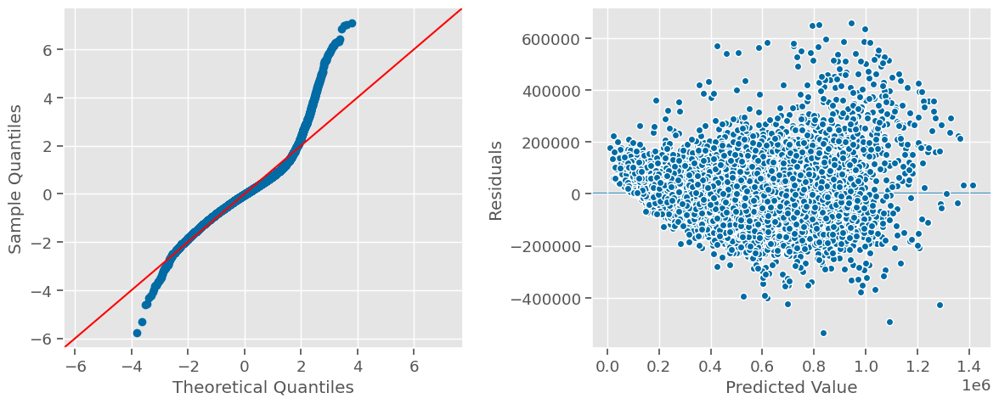

In [51]:
## instantiate an OLS model WITH the training data.
model_cln_scaled = sm.OLS(y_train_cln, X_train_scaled_df_cln)

## Fit the model and view the summary
result_cln_scaled = model_cln_scaled.fit()
lp.evaluate_ols(result_cln_scaled,X_train_scaled_df_cln, y_train_cln)

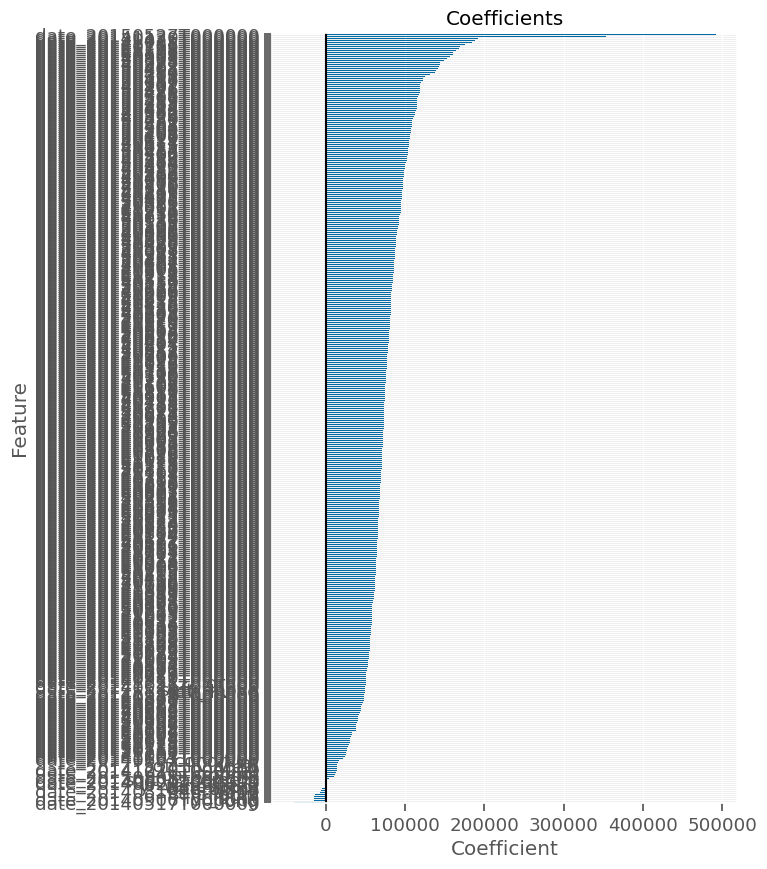

In [52]:
fig_scaled =lp.plot_coeffs(result_cln_scaled,ohe_cols,include_const=True)

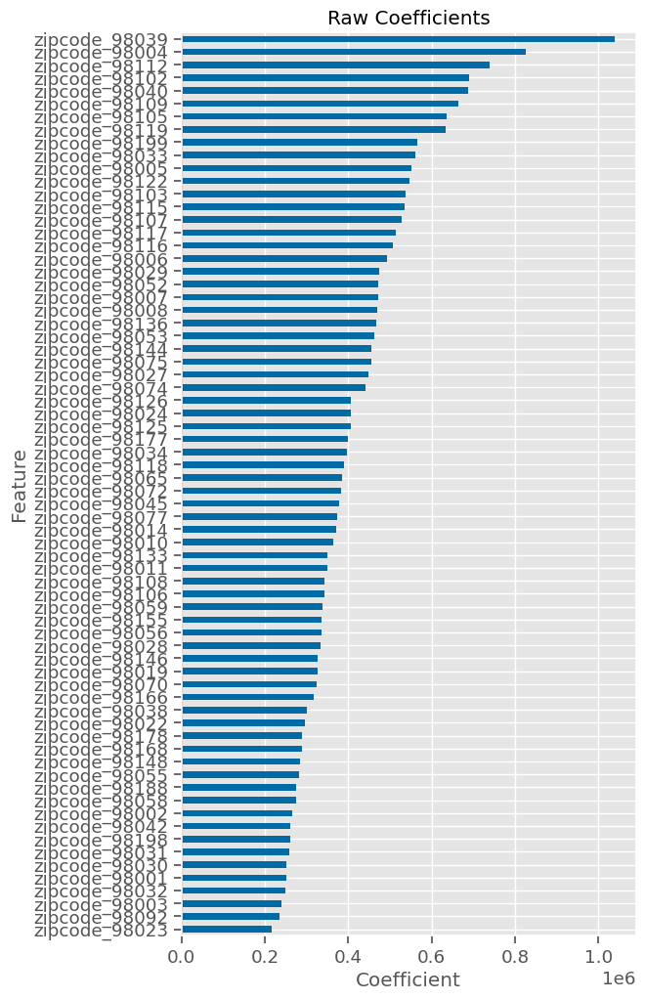

In [53]:
fig_scaled_zips =lp.plot_coeffs(result_cln_scaled, nonohe_cols, figsize=(6,12),include_const=True,title="Raw Coefficients")

### Scaled Numeric - with Constant

In [54]:
X_train_scaled_df_cln_cnst.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date_20140502T000000,date_20140503T000000,date_20140504T000000,date_20140505T000000,date_20140506T000000,date_20140507T000000,date_20140508T000000,date_20140509T000000,date_20140510T000000,date_20140511T000000,date_20140512T000000,date_20140513T000000,date_20140514T000000,date_20140515T000000,date_20140516T000000,date_20140517T000000,date_20140518T000000,date_20140519T000000,date_20140520T000000,date_20140521T000000,date_20140522T000000,date_20140523T000000,date_20140524T000000,date_20140525T000000,date_20140526T000000,date_20140527T000000,date_20140528T000000,date_20140529T000000,date_20140530T000000,date_20140531T000000,date_20140601T000000,date_20140602T000000,date_20140603T000000,...,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,const
count,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.0,1.402600e+04,1.402600e+04,1.402600e+04,1.402600e+04,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,...,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.000000,14026.0
mean,2.269522e-16,1.904777e-16,-1.043575e-16,-2.064353e-17,-7.193574e-17,0.0,2.127677e-17,-6.028418e-17,9.574546e-17,1.104366e-16,8.004118e-17,-3.185436e-15,0.0,2.031273e-14,-2.339431e-14,2.836902e-17,2.380972e-17,0.003066,0.000143,0.000214,0.003993,0.004278,0.003921,0.004064,0.003779,0.000214,0.000143,0.003494,0.003779,0.003707,0.003707,0.002781,0.000071,0.000285,0.004420,0.004777,0.004064,0.003351,0.003565,0.000499,0.000285,0.000570,0.004919,0.005419,0.003208,0.002638,0.000214,0.000356,0.004420,0.004848,...,0.019393,0.026094,0.027378,0.000713,0.010053,0.027592,0.000499,0.028875,0.017753,0.013332,0.020818,0.021817,0.023029,0.014402,0.002567,0.012905,0.020676,0.017254,0.008270,0.016541,0.004706,0.029018,0.009981,0.016826,0.013546,0.008983,0.005205,0.010409,0.029873,0.013760,0.027093,0.024668,0.007985,0.012619,0.019606,0.016256,0.025025,0.011835,0.014544,0.012976,0.002709,0.022244,0.010980,0.014259,0.010908,0.011122,0.006631,0.012905,0.013974,1.0
std,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,1.000036e+00,0.0,1.000036e+00,1.000036e+00,1.000036e+00,1

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     158.4
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        20:23:53   Log-Likelihood:            -1.8033e+05
No. Observations:               14026   AIC:                         3.616e+05
Df Residuals:                   13575   BIC:                         3.650e+05
Df Model:                         450                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
bedrooms             -4191.5782   1133.683     -3.697      0.000   -6413.755   -1969.402
bathrooms             1.146e+04   1450.156      7.903      0.000    8618.055    1.43e+04
sqft_living           2.794e+16   2.23e+17      0.125      0.900    -4.1e+17    4.66e+17
sqft_lot              1.263e+04   1395.510      9.048      0.000    9891.437    1.54e+04
floors               -1.342e+04   1612.251     -8.326      0.000   -1.66e+04   -1.03e+04
waterfront           -1.065e+16   8.51e+16     -0.125      0.900   -1.77e+17    1.56e+17
view                  1.428e+04    879.814     16.236      0.000    1.26e+04     1.6e+04
condition             1.694e+04    971.599     17.437      0.000     1.5e+04    1.88e+04
grade                 5.064e+04   1516.195     33.402      0.000    4.77e+04    5.36e+04
sqft_above           -2.685e+16   2.15e+17     -0.125      0.900   -4.47e+17    3.94e+17
sqft_basement        -1.462e+16   1.17e+17     -0.125      0.900   -2.44e+17    2.14e+17
yr_built             -1.407e+04   1453.506     -9.677      0.000   -1.69e+04   -1.12e+04
yr_renovated          7.043e+15   5.63e+16      0.125      0.900   -1.03e+17    1.17e+17
lat                   1.618e+04   6937.929      2.332      0.020    2579.222    2.98e+04
long                 -1.478e+04   6036.332     -2.449      0.014   -2.66e+04   -2952.673
sqft_living15         1.432e+04   1458.907      9.814      0.000    1.15e+04    1.72e+04
sqft_lot15           -6473.9341   1481.836     -4.369      0.000   -9378.539   -3569.329
date_20140502T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140503T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140504T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140505T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140506T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140507T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140508T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140509T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140510T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140511T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140512T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140513T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140514T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140515T000000  9.617e+12   7.68e+13      0.125      0.900   -1.41e+14     1.6e+14
date_20140516T000000  9.617e+12   7.68e+13      0.125    

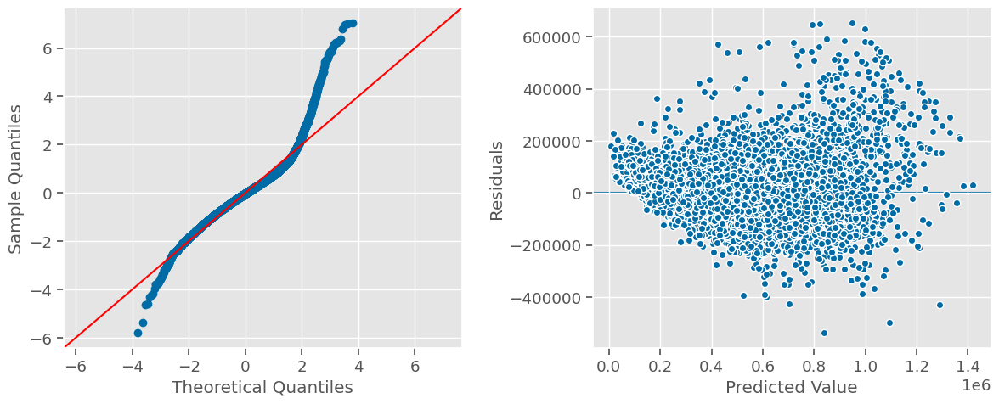

In [55]:
## instantiate an OLS model WITH the training data.
model_cln_scaled_cnst = sm.OLS(y_train_cln, X_train_scaled_df_cln_cnst)

## Fit the model and view the summary
result_cln_scaled_cnst = model_cln_scaled_cnst.fit()
lp.evaluate_ols(result_cln_scaled_cnst,X_train_scaled_df_cln_cnst, y_train_cln)

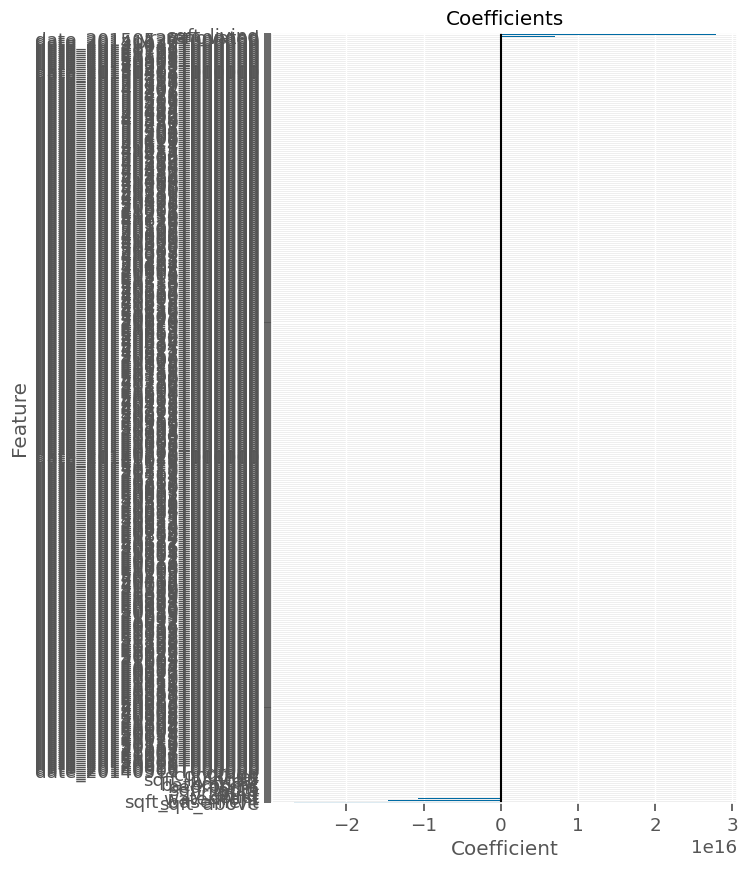

In [56]:
fig_scaled =lp.plot_coeffs(result_cln_scaled_cnst,ohe_cols,include_const=True)

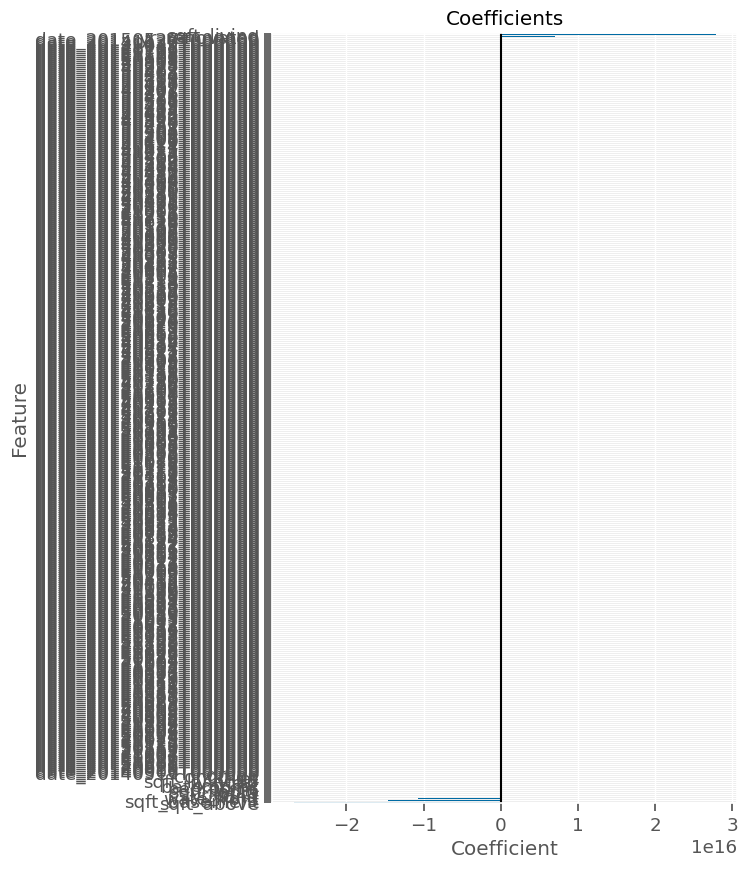

In [57]:
fig_scaled =lp.plot_coeffs(result_cln_scaled_cnst,ohe_cols,include_const=False)

# Adding Explanations

## Sklearn LinearRegression

> Pick 1 of the statsmodels models above to remake in sklearn for model explanations

In [58]:
from sklearn.linear_model import LinearRegression

In [59]:
## Making new var name sfor sklearn - update these to change model
ols_results = result_scaled_cnst
# lp.evaluate_ols(ols_results,X_tr,y_tr)
X_tr = X_train_scaled_df_cnst
X_te = X_test_scaled_df_cnst
y_tr = y_train
y_te = y_test

## If const in orig df, 
fit_intercept = 'const' in X_tr.columns

if fit_intercept==True:
    X_tr = X_tr.drop(columns='const')
    X_te = X_te.drop(columns='const')
fit_intercept

True

In [60]:
linreg = LinearRegression(fit_intercept=fit_intercept)
linreg.fit(X_tr, y_tr)
print(f"Train R^2: {format(linreg.score(X_tr,y_tr),'.2f')}")
print(f"Test R^2: {format(linreg.score(X_te,y_te),'.2f')}")
linreg.get_params()

Train R^2: 0.82
Test R^2: -47034670463653712.00


{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

In [61]:
coeffs = lp.get_coeffs(linreg,X_tr,name='LinReg Coeffs')
coeffs#.head(20)

bedrooms        -2.235419e+04
bathrooms        1.843189e+04
sqft_living     -2.227676e+17
sqft_lot         8.672668e+03
floors          -2.545070e+04
                     ...     
zipcode_98178    1.616831e+16
zipcode_98188    1.616831e+16
zipcode_98198    1.616831e+16
zipcode_98199    1.616831e+16
const           -1.951780e+16
Name: LinReg Coeffs, Length: 457, dtype: float64

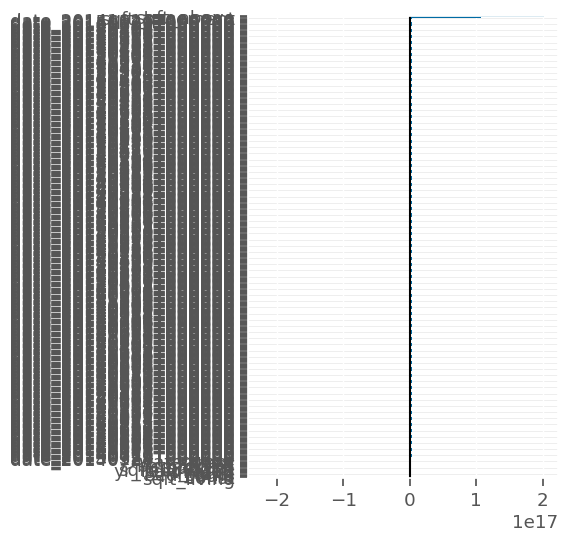

In [62]:
ax = coeffs.drop(ohe_cols).sort_values().plot(kind='barh',figsize=(4,6))
ax.axvline(0,color='black')

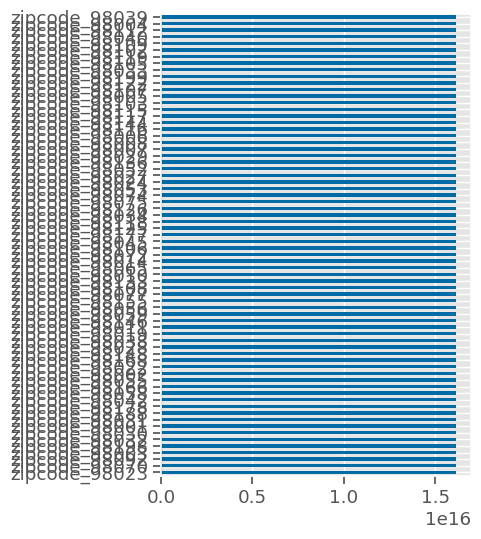

In [63]:
if len(ohe_cols)>1:

    ax = coeffs[ohe_cols].sort_values().plot(kind='barh',figsize=(4,6))
    ax.axvline(0,color='black')

In [64]:
## save 1 df of skelarn vs ols coeffs
compare_coeffs = pd.DataFrame({'OLS':ols_results.params,
                              'LinReg':coeffs}).round(2)
compare_coeffs['Agree?'] = compare_coeffs['OLS']==compare_coeffs['LinReg']

display(compare_coeffs.round(3))
compare_coeffs['Agree?'].value_counts(1)
#compare_coeffs.style.format({'OLS':"{:,.2f}","LinReg":"{:,.2f}"})

,OLS,LinReg,Agree?
bedrooms,-22664.75,-2.235419e+04,False
bathrooms,19214.27,1.843189e+04,False
sqft_living,86572.26,-2.227676e+17,False
sqft_lot,9104.47,8.672670e+03,False
floors,-25332.47,-2.545070e+04,False
...,...,...,...
zipcode_98178,-150217.96,1.616831e+16,False
zipcode_98188,-152176.29,1.616831e+16,False
zipcode_98198,-181579.96,1.616831e+16,False
zipcode_98199,156224.68,1.616831e+16,False


False    1.0
Name: Agree?, dtype: float64

In [65]:
compare_coeffs[compare_coeffs['Agree?']==True]

,OLS,LinReg,Agree?


In [66]:
# compare_coeffs[compare_coeffs['Agree?']==False]

In [67]:
compare_coeffs.style.bar()

,OLS,LinReg,Agree?
bedrooms,-22664.750000,-22354.190000,False
bathrooms,19214.270000,18431.890000,False
sqft_living,86572.260000,-222767624937125792.000000,False
sqft_lot,9104.470000,8672.670000,False
floors,-25332.470000,-25450.700000,False
waterfront,57989.450000,58401.960000,False
view,45361.410000,45389.590000,False
condition,16830.320000,16787.060000,False
grade,70082.470000,70147.830000,False
sqft_above,88536.850000,201563507777362848.000000,False


> ISSUE WITH COEFFICIENTS NOT MATCHING - SEE IF TRUE FOR OTHER DATASETS. 

### Shap

In [68]:
import shap
shap.initjs()

shap.__version__

'0.41.0'

In [69]:
## sampling 200 rows from training data
X_shap = shap.sample(X_tr,nsamples=200,random_state=321)

In [70]:
## Creating explainer from model and getting shap values
explainer = shap.LinearExplainer(linreg,X_shap)
shap_values = explainer(X_shap)
shap_values.shape

(200, 456)

In [71]:
# [i for i in dir(shap_values) if not i.startswith("_")]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


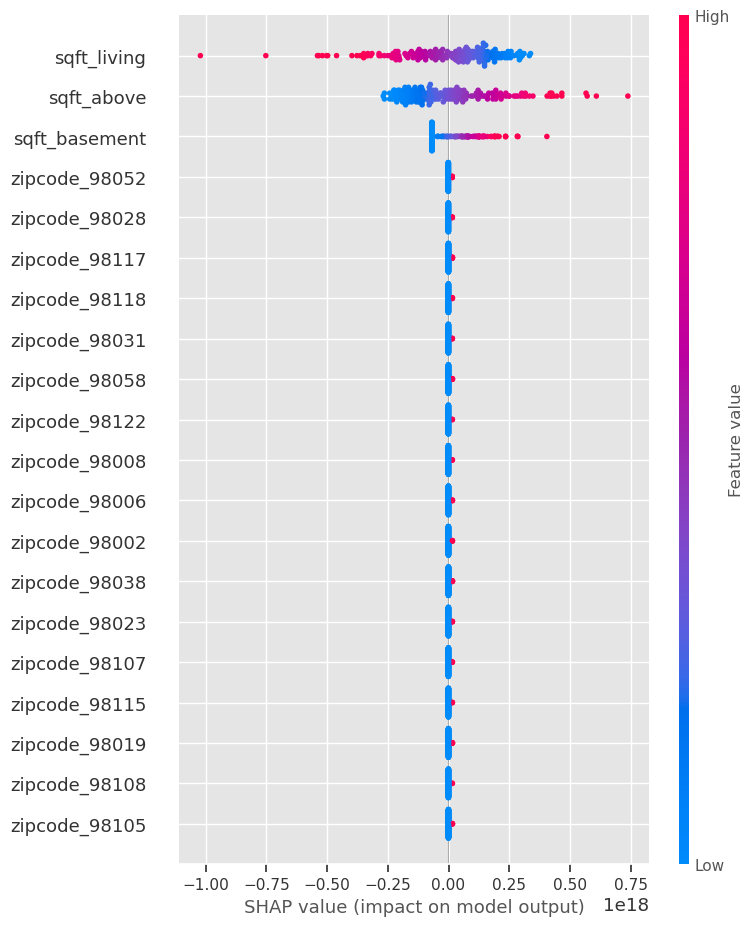

In [72]:
shap.summary_plot(shap_values)

In [73]:
explainer.expected_value

516908.0

In [74]:
shap.force_plot(explainer.expected_value,shap_values= shap_values.values, features=X_shap)       

## RandomForest

In [75]:
from sklearn.ensemble import RandomForestRegressor
rf_reg = RandomForestRegressor()
rf_reg.fit(X_tr,y_tr)

RandomForestRegressor()

In [76]:
scores = lp.evaluate_regression(rf_reg,X_te, y_te, X_train_df=X_tr, y_train=y_tr,
                            return_scores=True)

TypeError: evaluate_regression() got an unexpected keyword argument 'X_train_df'

In [ ]:
importances = lp.get_importance(rf_reg,X_test_df,top_n=50)

### Permutation Importance

In [ ]:
from sklearn.inspection import permutation_importance
## Permutation importance takes a fit mode and test data. 
r = permutation_importance(linreg, X_tr, y_tr,
#                            n_repeats=30
                          )
r.keys()

In [ ]:
## can make the mean importances into a series
permutation_importances = pd.Series(r['importances_mean'],index=X_tr.columns,
                           name = 'permutation importance')
permutation_importances

In [ ]:
permutation_importances.sort_values().tail(20).plot(kind='barh',figsize=(6,12))

In [ ]:
X_shap = shap.sample(X_tr,nsamples=200,random_state=321)

In [ ]:
explainer = shap.TreeExplainer(rf_reg,X_shap)
shap_values = explainer(X_shap)

In [ ]:
shap.summary_plot(shap_values)

In [ ]:
shap.force_plot(explainer.expected_value,shap_values= shap_values.values, features=X_shap)       